In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('zomato.csv', encoding='ISO-8859-1')

In [3]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [4]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [5]:
df1 = pd.read_excel('Country-Code.xlsx')

In [6]:
df1

,Country Code,Country
0,1,India
1,14,Australia
2,30,Brazil
3,37,Canada
4,94,Indonesia
5,148,New Zealand
6,162,Phillipines
7,166,Qatar
8,184,Singapore
9,189,South Africa


In [7]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [8]:
#Here we have missing values for Cuisines

In [9]:
listmissing_cuisines = df[df['Cuisines'].isnull()]['Restaurant Name']
listmissing_cuisines

84                      Cookie Shoppe
87     Pearly's Famous Country Cookng
94                  Jimmie's Hot Dogs
297                    Corkscrew Cafe
328                          Dovetail
346              HI Lite Bar & Lounge
368                         Hillstone
418                  Leonard's Bakery
455          Tybee Island Social Club
Name: Restaurant Name, dtype: object

In [10]:
#We will convert the cafe names into cafe (to keep it simple) the rest will change it to 'American'

In [11]:
Convert_Cafe = ['Cookie Shoppe', 'Corkscrew Cafe', "Leonard's Bakery"]
for n in Convert_Cafe:
    df.loc[df['Restaurant Name'] == n, 'Cuisines'] = df.loc[df['Restaurant Name'] == n, 'Cuisines'].fillna('Cafe')
df.loc[df['Restaurant Name'].isin(Convert_Cafe), ['Restaurant Name', 'Cuisines']]

,Restaurant Name,Cuisines
84,Cookie Shoppe,Cafe
297,Corkscrew Cafe,Cafe
418,Leonard's Bakery,Cafe


In [12]:
Convert_American = ["Pearly's Famous Country Cookng", "Jimmie's Hot Dogs", "Dovetail", "HI Lite Bar & Lounge", "Hillstone", "Tybee Island Social Club" ]
for n in Convert_American:
    df.loc[df['Restaurant Name'] == n, 'Cuisines'] = df.loc[df['Restaurant Name'] == n, 'Cuisines'].fillna('American')
df.loc[df['Restaurant Name'].isin(Convert_American), ['Restaurant Name', 'Cuisines']]

,Restaurant Name,Cuisines
87,Pearly's Famous Country Cookng,American
94,Jimmie's Hot Dogs,American
328,Dovetail,American
346,HI Lite Bar & Lounge,American
368,Hillstone,American
455,Tybee Island Social Club,American


In [13]:
df.head(10)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
5,18189371,Din Tai Fung,162,Mandaluyong City,"Ground Floor, Mega Fashion Hall, SM Megamall, ...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056314,14.583764,Chinese,...,Botswana Pula(P),No,No,No,No,3,4.4,Green,Very Good,336
6,6300781,Buffet 101,162,Pasay City,"Building K, SM By The Bay, Sunset Boulevard, M...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979667,14.531333,"Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.0,Green,Very Good,520
7,6301290,Vikings,162,Pasay City,"Building B, By The Bay, Seaside Boulevard, Mal...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979333,14.540000,"Seafood, Filipino, Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.2,Green,Very Good,677
8,6300010,Spiral - Sofitel Philippine Plaza Manila,162,Pasay City,"Plaza Level, Sofitel Philippine Plaza Manila, ...","Sofitel Philippine Plaza Manila, Pasay City","Sofitel Philippine Plaza Manila, Pasay City, P...",120.980090,14.552990,"European, Asian, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.9,Dark Green,Excellent,621
9,6314987,Locavore,162,Pasig City,"Brixton Technology Center, 10 Brixton Street, ...",Kapitolyo,"Kapitolyo, Pasig City",121.056532,14.572041,Filipino,...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,532


In [14]:
df.tail(10)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
9541,5905215,Emirgan Sí_tiô,208,ÛÁstanbul,"Emirgan Mahallesi, SakÛ±p SabancÛ± Caddesi, No...",Emirgí¢n,"Emirgí¢n, ÛÁstanbul",29.056620,41.104969,"Restaurant Cafe, Turkish, Desserts",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,877
9542,5926979,Leman Kí_ltí_r,208,ÛÁstanbul,"CaferaÛôa Mahallesi, Neôet í_mer Sokak, No 9/...",KadÛ±kí_y Merkez,"KadÛ±kí_y Merkez, ÛÁstanbul",29.022805,40.989705,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,3,3.7,Yellow,Good,506
9543,5916085,Dem Karakí_y,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, Hoca Ta...",Karakí_y,"Karakí_y, ÛÁstanbul",28.978237,41.024633,Cafe,...,Turkish Lira(TL),No,No,No,No,2,4.5,Dark Green,Excellent,761
9544,5915547,Karakí_y Gí_llí_oÛôlu,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977636,41.022904,"Desserts, Bí_rek",...,Turkish Lira(TL),No,No,No,No,2,4.7,Dark Green,Excellent,1305
9545,5915054,Baltazar,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, KÛ±lÛ±í...",Karakí_y,"Karakí_y, ÛÁstanbul",28.981103,41.025785,"Burger, Izgara",...,Turkish Lira(TL),No,No,No,No,3,4.3,Green,Very Good,870
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901
9550,5927402,Walter's Coffee Roastery,208,ÛÁstanbul,"CafeaÛôa Mahallesi, BademaltÛ± Sokak, No 21/B,...",Moda,"Moda, ÛÁstanbul",29.026016,40.984776,Cafe,...,Turkish Lira(TL),No,No,No,No,2,4.0,Green,Very Good,591


In [15]:
df.duplicated().sum()

0

In [16]:
df.isin(['?', '', 'NA', 'NaN', '-', ' ']).sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [17]:
df.isin([0]).sum()

Restaurant ID              0
Restaurant Name            0
Country Code               0
City                       0
Address                    0
Locality                   0
Locality Verbose           0
Longitude                498
Latitude                 498
Cuisines                   0
Average Cost for two      18
Currency                   0
Has Table booking          0
Has Online delivery        0
Is delivering now          0
Switch to order menu       0
Price range                0
Aggregate rating        2148
Rating color               0
Rating text                0
Votes                   1094
dtype: int64

In [18]:
df.size

200571

In [19]:
df.shape

(9551, 21)

In [20]:
count = df[df['Average Cost for two'] == 0].groupby('Currency').size()
count

Currency
Dollar($)             9
Indian Rupees(Rs.)    9
dtype: int64

In [21]:
#We can see some missing data for average cost for two 

In [22]:
df.loc[df['Average Cost for two'] == 0, 'Average Cost for two'] = np.nan
median = df.groupby('Currency')['Average Cost for two'].median()
def fill_median(row):
    if pd.isna(row['Average Cost for two']):
        return median.get(row['Currency'], np.nan)
    else:
        return row['Average Cost for two']
df['Average Cost for two'] = df.apply(fill_median, axis=1)
any_zero = (df['Average Cost for two'] == 0).sum()
print(f'Total zero {any_zero}')

Total zero 0


In [23]:
#We can fix the missing values for lat & Long 

In [24]:
mean_long = df.loc[df['Longitude'] != 0, 'Longitude'].mean()
mean_lat = df.loc[df['Latitude'] != 0, 'Latitude'].mean()

df.loc[df['Longitude'] == 0, 'Longitude'] = mean_long
df.loc[df['Latitude'] == 0, 'Latitude'] = mean_lat

In [25]:
any_zero1 = (df['Longitude'] == 0).sum()
print(f'Total zero {any_zero1}')

Total zero 0


In [26]:
any_zero2 = (df['Latitude'] == 0).sum()
print(f'Total zero {any_zero2}')

Total zero 0


In [27]:
#For aggregate rating and votes - we will keep the data as it is to reflect real world cases.

In [28]:
join_data = pd.merge(df, df1, on='Country Code', how='left')

In [29]:
pd.set_option('display.max_columns', 100)
join_data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100.0,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200.0,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000.0,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500.0,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500.0,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80.0,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788,Turkey
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105.0,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034,Turkey
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170.0,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661,Turkey
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120.0,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901,Turkey


In [30]:
join_data.nunique()

Restaurant ID           9551
Restaurant Name         7446
Country Code              15
City                     141
Address                 8918
Locality                1208
Locality Verbose        1265
Longitude               8120
Latitude                8677
Cuisines                1825
Average Cost for two     139
Currency                  12
Has Table booking          2
Has Online delivery        2
Is delivering now          2
Switch to order menu       1
Price range                4
Aggregate rating          33
Rating color               6
Rating text                6
Votes                   1012
Country                   15
dtype: int64

In [31]:
join_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9551 non-null   object 
 10  Average Cost for two  9551 non-null   float64
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [32]:
#We have different types of data here ranging from int, float and object

In [33]:
join_data.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,67.654138,27.276614,1199.658360,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,38.643015,9.186937,16121.155705,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,7.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [34]:
Cat_Col = (['Restaurant Name', 'City', 'Address', 'Locality', 'Locality Verbose', 'Cuisines', 'Currency', 'Has Table booking', 'Has Online Delivery', 'Is delivering now', 'Switch to order menu', 'Rating Color', 'Rating text', 'Country'])

In [35]:
Num_Col = (['Country Code', 'Longitude', 'Latitude', 'Average cost for two', 'Price range', 'Aggregate rating', 'Votes'])

In [36]:
cat_col = join_data.select_dtypes(include=['object']).columns
cat_summary = {column: join_data[column].value_counts() for column in cat_col}
cat_summary

{'Restaurant Name': Restaurant Name
 Cafe Coffee Day             83
 Domino's Pizza              79
 Subway                      63
 Green Chick Chop            51
 McDonald's                  48
                             ..
 Odeon Social                 1
 Johnny Rockets               1
 House of Commons             1
 HotMess                      1
 Walter's Coffee Roastery     1
 Name: count, Length: 7446, dtype: int64,
 'City': City
 New Delhi           5473
 Gurgaon             1118
 Noida               1080
 Faridabad            251
 Ghaziabad             25
                     ... 
 Panchkula              1
 Mc Millan              1
 Mayfield               1
 Macedon                1
 Vineland Station       1
 Name: count, Length: 141, dtype: int64,
 'Address': Address
 Dilli Haat, INA, New Delhi                                                               11
 Sector 41, Noida                                                                         11
 Greater Kailash (GK) 1

In [37]:
num_col = join_data.select_dtypes(include=['int64']).columns
num_summary = {column: join_data[column].value_counts() for column in num_col}
num_summary

{'Restaurant ID': Restaurant ID
 6317637     1
 18254520    1
 18462589    1
 18336474    1
 18336477    1
            ..
 313059      1
 763         1
 7557        1
 525         1
 5927402     1
 Name: count, Length: 9551, dtype: int64,
 'Country Code': Country Code
 1      8652
 216     434
 215      80
 30       60
 214      60
 189      60
 148      40
 208      34
 14       24
 162      22
 94       21
 184      20
 166      20
 191      20
 37        4
 Name: count, dtype: int64,
 'Price range': Price range
 1    4444
 2    3113
 3    1408
 4     586
 Name: count, dtype: int64,
 'Votes': Votes
 0      1094
 1       483
 2       327
 3       244
 4       207
        ... 
 615       1
 538       1
 823       1
 650       1
 901       1
 Name: count, Length: 1012, dtype: int64}

<Axes: ylabel='count'>

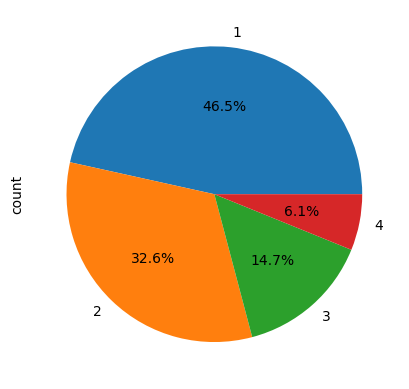

In [38]:
join_data['Price range'].value_counts().plot(kind='pie', autopct='%1.1f%%')

In [39]:
join_data.Country.value_counts()

Country
India             8652
United States      434
United Kingdom      80
Brazil              60
UAE                 60
South Africa        60
New Zealand         40
Turkey              34
Australia           24
Phillipines         22
Indonesia           21
Singapore           20
Qatar               20
Sri Lanka           20
Canada               4
Name: count, dtype: int64

In [40]:
#We can see that there are a lot of data for India followed by the US 

In [41]:
bins = [0, 100, 500, 1000, 5000, 10000, 20000, 50000] 
labels = ['0-100', '100-500', '500-1000', '1000-5000', '5000-10000', '10000-20000', '20000-50000']
join_data['Average Cost for twoB'] = pd.cut(join_data['Average Cost for two'], bins=bins, labels=labels, include_lowest=True)
ACFT = pd.crosstab(join_data['Average Cost for twoB'], join_data['Currency'])
ACFT

Currency,Botswana Pula(P),Brazilian Real(R$),Dollar($),Emirati Diram(AED),Indian Rupees(Rs.),NewZealand($),Pounds(£),Qatari Rial(QR),Rand(R),Sri Lankan Rupee(LKR),Turkish Lira(TL)
Average Cost for twoB,,,,,,,,,,,
0-100,0,32,474,23,354,35,76,5,0,0,28
100-500,0,28,8,37,4894,5,4,14,51,0,6
500-1000,9,0,0,0,2282,0,0,1,7,3,0
1000-5000,12,0,0,0,1112,0,0,0,2,17,0
5000-10000,1,0,0,0,10,0,0,0,0,0,0


In [42]:
pd.set_option('display.max_rows', 10000)
pd.crosstab(index=[join_data['Cuisines']], columns=join_data['Average Cost for twoB'])

Average Cost for twoB,0-100,100-500,500-1000,1000-5000,5000-10000
Cuisines,,,,,
Afghani,0,2,2,0,0
"Afghani, Mughlai, Chinese",0,1,0,0,0
"Afghani, North Indian",0,0,1,0,0
"Afghani, North Indian, Pakistani, Arabian",0,1,0,0,0
African,0,1,0,0,0
"African, Portuguese",0,1,0,0,0
American,28,5,3,1,0
"American, Asian, Burger",1,0,0,0,0
"American, Asian, European, Seafood",0,0,0,1,0


In [43]:
def highest_consumed_cuisine(join_data, ntop_cuisines):
    counts = join_data['Cuisines'].value_counts().head(ntop_cuisines)
    top_cuisines = counts.index
    top_cuisines_join_data = join_data[join_data['Cuisines'].isin(top_cuisines)]
    crosstab = pd.crosstab(index=top_cuisines_join_data['Cuisines'], 
                            columns=top_cuisines_join_data['Average Cost for twoB'])
    return crosstab
top = highest_consumed_cuisine(join_data, 10)
top

Average Cost for twoB,0-100,100-500,500-1000,1000-5000,5000-10000
Cuisines,,,,,
Bakery,13,185,20,0,0
"Bakery, Desserts",5,128,35,2,0
Cafe,19,152,117,14,0
Chinese,16,250,55,32,1
Fast Food,42,303,7,2,0
North Indian,60,721,110,44,1
"North Indian, Chinese",0,256,203,52,0
"North Indian, Mughlai",0,98,190,46,0
"North Indian, Mughlai, Chinese",0,59,114,24,0


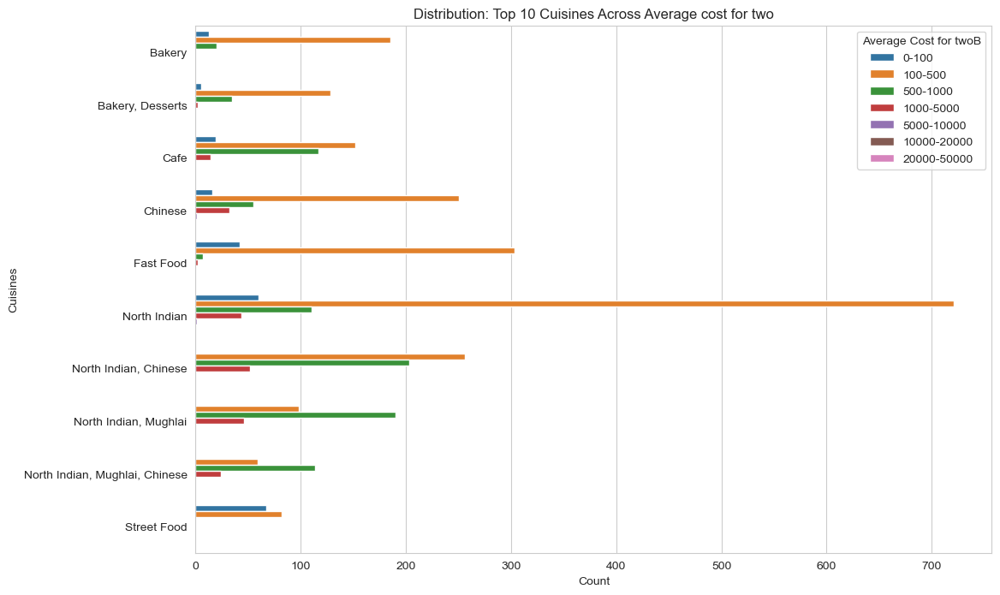

In [44]:
sns.set_style("whitegrid")
f, ax = plt.subplots(figsize=(12, 8))
cuisines = top.stack().reset_index().rename(columns={0: 'Overall Count'})
sns.barplot(x='Overall Count', y='Cuisines', hue='Average Cost for twoB', data=cuisines, ax=ax)
ax.set_xlabel('Count')
ax.set_ylabel('Cuisines')
ax.set_title('Distribution: Top 10 Cuisines Across Average cost for two')
plt.legend(title='Average Cost for twoB')
plt.show()

In [45]:
#here we can see that there's a lot of demand for North Indian food, followed by fast food, North-Indian Chinese

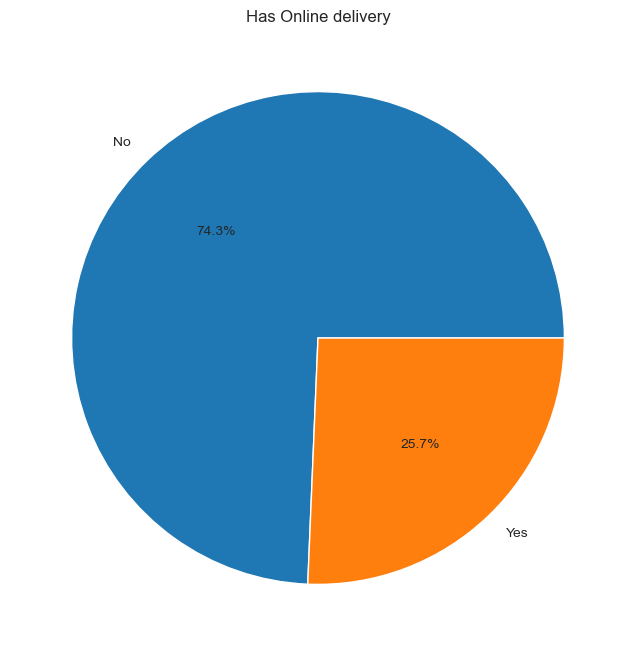

In [46]:
Has_Online_delivery = join_data['Has Online delivery'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(Has_Online_delivery, labels=Has_Online_delivery.index, autopct='%1.1f%%')
plt.title('Has Online delivery')
plt.show()

In [47]:
#Very less percentage of restaurants have online delivery

In [48]:
join_data[join_data['Has Online delivery'] == 'Yes'].groupby('Country').size().reset_index()

,Country,0
0,India,2423
1,UAE,28


In [49]:
#We can see that out of 8652 only 2423 have online delivery (28%) whereas for UAE out of 60, 46% have online delivery

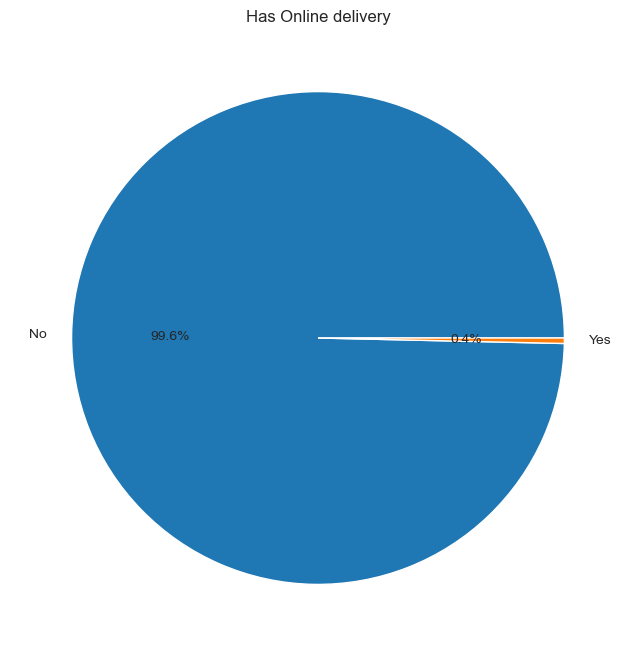

In [50]:
Is_delivering_now = join_data['Is delivering now'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(Is_delivering_now, labels=Is_delivering_now.index, autopct='%1.1f%%')
plt.title('Has Online delivery')
plt.show()

In [51]:
#Only 0.4% delivery now - this variable is a bit flawed and not necessarily valuable

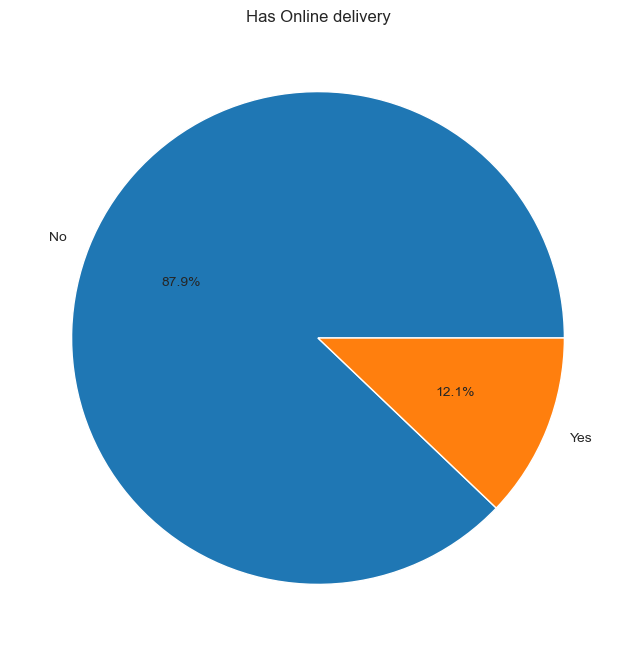

In [52]:
Has_Table_booking = join_data['Has Table booking'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(Has_Table_booking, labels=Has_Table_booking.index, autopct='%1.1f%%')
plt.title('Has Online delivery')
plt.show()

In [53]:
join_data[join_data['Has Table booking'] == 'Yes'].groupby('Country').size().reset_index()

,Country,0
0,India,1111
1,Phillipines,14
2,Qatar,1
3,South Africa,2
4,UAE,18
5,United Kingdom,12


In [54]:
#Majoirty of the restaurants don't have table booking but India has the highest number of table booking

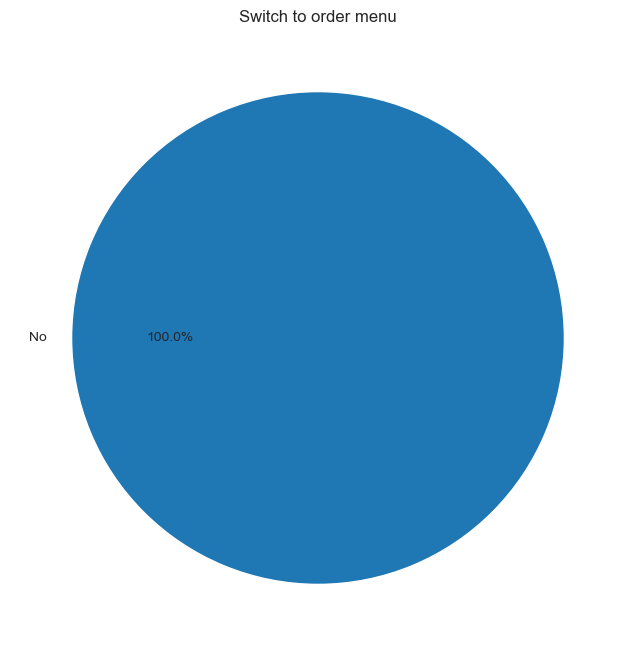

In [55]:
menu= join_data['Switch to order menu'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(menu, labels=menu.index, autopct='%1.1f%%')
plt.title('Switch to order menu')
plt.show()

In [56]:
#Again, does not tell us much about anything

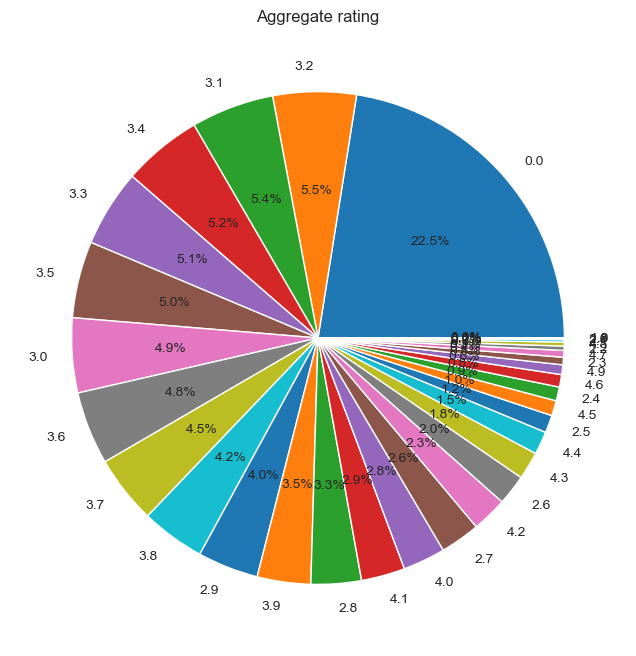

In [57]:
Aggregate_rating = join_data['Aggregate rating'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(Aggregate_rating, labels=Aggregate_rating.index, autopct='%1.1f%%')
plt.title('Aggregate rating')
plt.show()

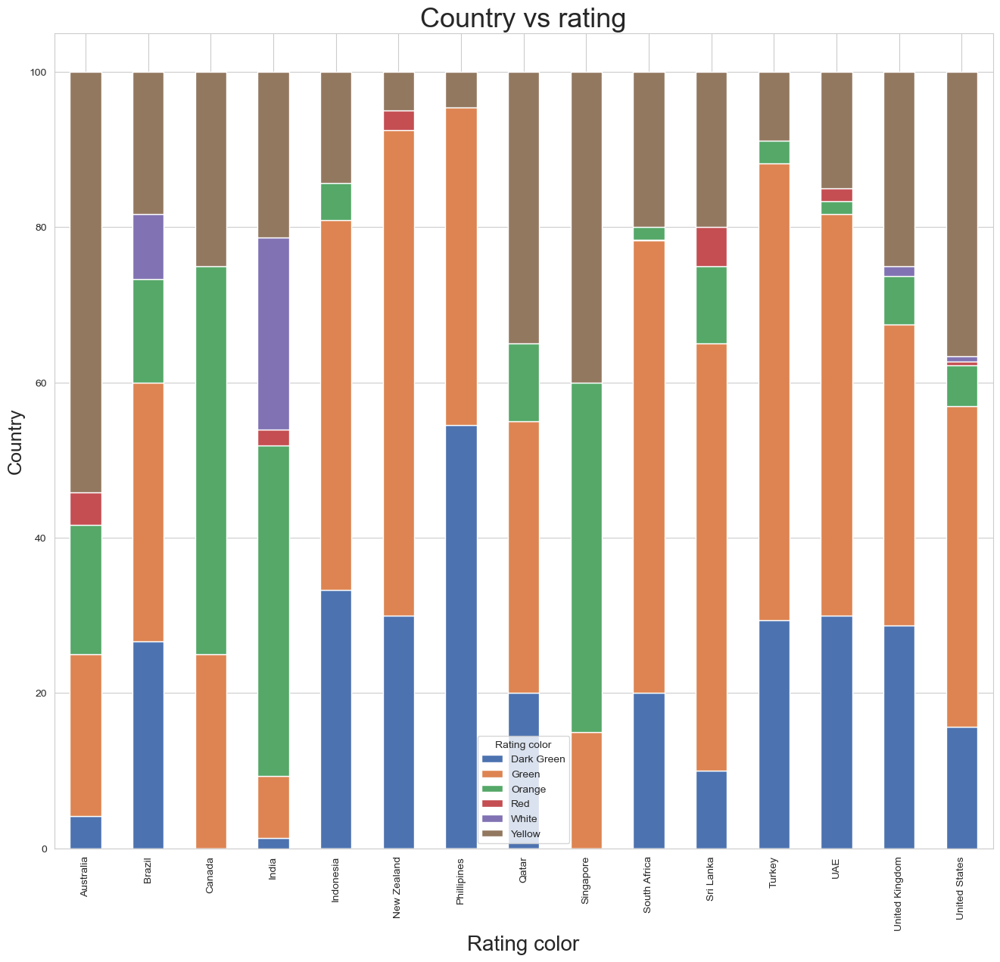

In [58]:
sns.set_palette('deep')
v = pd.crosstab(join_data['Country'], join_data['Rating color'])
(v.div(v.sum(axis=1),axis=0)*100).plot(kind='bar',stacked=True,figsize=(16,14))
plt.title('Country vs rating', fontsize=26, fontweight='light')
plt.xlabel('Rating color', fontsize=20,fontweight='light')
plt.ylabel('Country', fontsize=18,fontweight='light')
plt.xticks(fontweight ='light')
plt.show()

In [59]:
overall_rating = join_data.groupby(['Rating color','Aggregate rating','Rating text']).size()

In [60]:
overall_rating

Rating color  Aggregate rating  Rating text
Dark Green    4.5               Excellent        95
              4.6               Excellent        78
              4.7               Excellent        42
              4.8               Excellent        25
              4.9               Excellent        61
Green         4.0               Very Good       266
              4.1               Very Good       274
              4.2               Very Good       221
              4.3               Very Good       174
              4.4               Very Good       144
Orange        2.5               Average         110
              2.6               Average         191
              2.7               Average         250
              2.8               Average         315
              2.9               Average         381
              3.0               Average         468
              3.1               Average         519
              3.2               Average         522
              3.3   

In [61]:
#here we can see the aggregate rating - there is a range for example white signifies no rating 
#Red signifies poor and it ranges from 1.8 to 2.4
#Orange is average which ranges from 2.5 to 3.4
#Yellow signifies good which ranges from 3.5 to 3.9
#Green from 4.0-4.4 Very good
#Dark green to 4.5 - 4.9

In [62]:
join_data[join_data['Rating text'] == 'Excellent'].groupby('Country').size().reset_index()

,Country,0
0,Australia,1
1,Brazil,16
2,India,116
3,Indonesia,7
4,New Zealand,12
5,Phillipines,12
6,Qatar,4
7,South Africa,12
8,Sri Lanka,2
9,Turkey,10


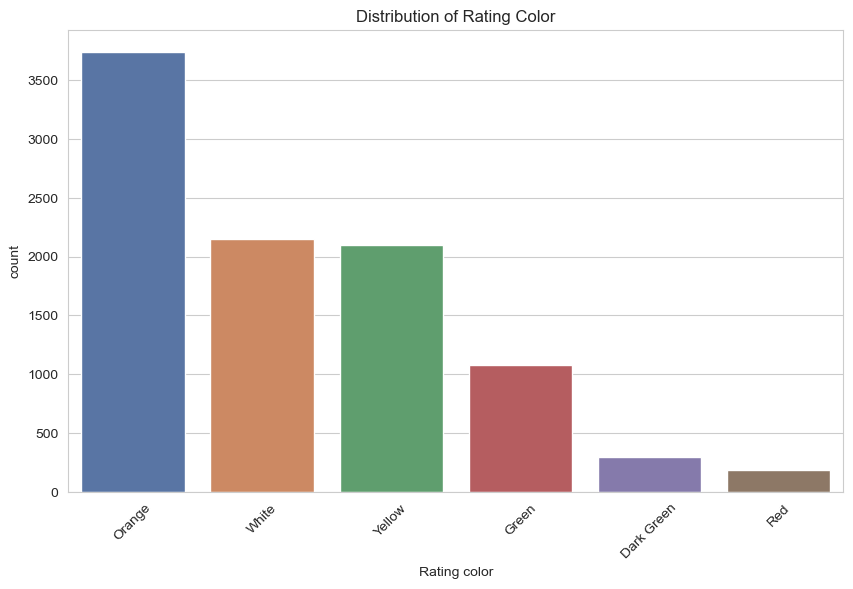

In [63]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Rating color', data=join_data, order=join_data['Rating color'].value_counts().index)
plt.title('Distribution of Rating Color')
plt.xticks(rotation=45)
plt.show()

#We can see that Orange rating is the highest and as we saw earlier, it's the average rating! followed by no rating which is an issue and we can also check by country as well but we can also see some Very good rating as well

In [64]:
join_data.loc[join_data['Rating text'].isin(['Excellent'])].Cuisines.value_counts().sort_values(ascending=False).reset_index().head(10)

,Cuisines,count
0,Cafe,9
1,Italian,7
2,North Indian,7
3,Indian,5
4,Ice Cream,5
5,Seafood,5
6,Asian,4
7,"North Indian, Mughlai",4
8,Desserts,4
9,"North Indian, Chinese",3


In [65]:
join_data.loc[join_data['Rating text'].isin(['Poor'])].Cuisines.value_counts().sort_values(ascending=False).reset_index().head(10)

,Cuisines,count
0,"North Indian, Chinese",17
1,"Pizza, Fast Food",13
2,North Indian,11
3,"North Indian, Mughlai",9
4,"North Indian, Mughlai, Chinese",9
5,Chinese,8
6,"American, Fast Food, Salad, Healthy Food",7
7,"South Indian, North Indian, Chinese",5
8,"Chinese, Fast Food",5
9,"Italian, Pizza, Fast Food",4


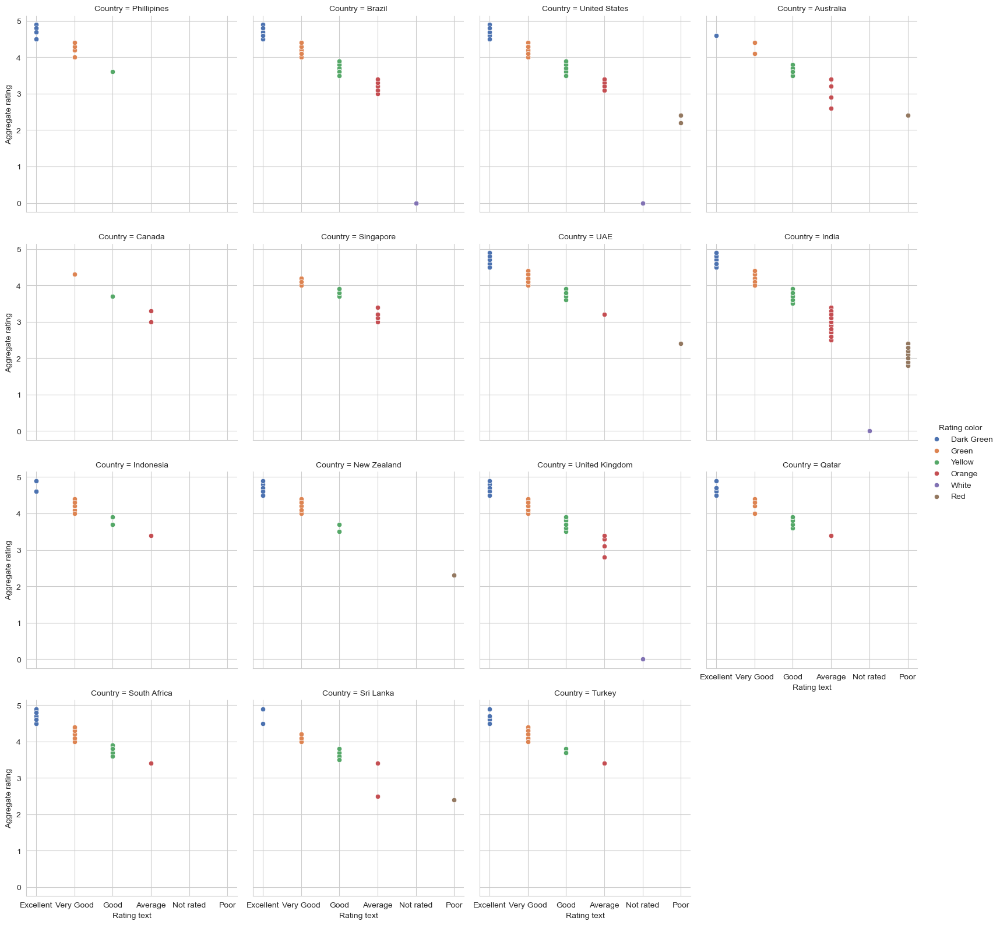

In [66]:
s = sns.FacetGrid(join_data, col='Country', hue='Rating color', col_wrap=4, height=4)
s = s.map(sns.scatterplot, 'Rating text', 'Aggregate rating')
s.add_legend()
plt.show()

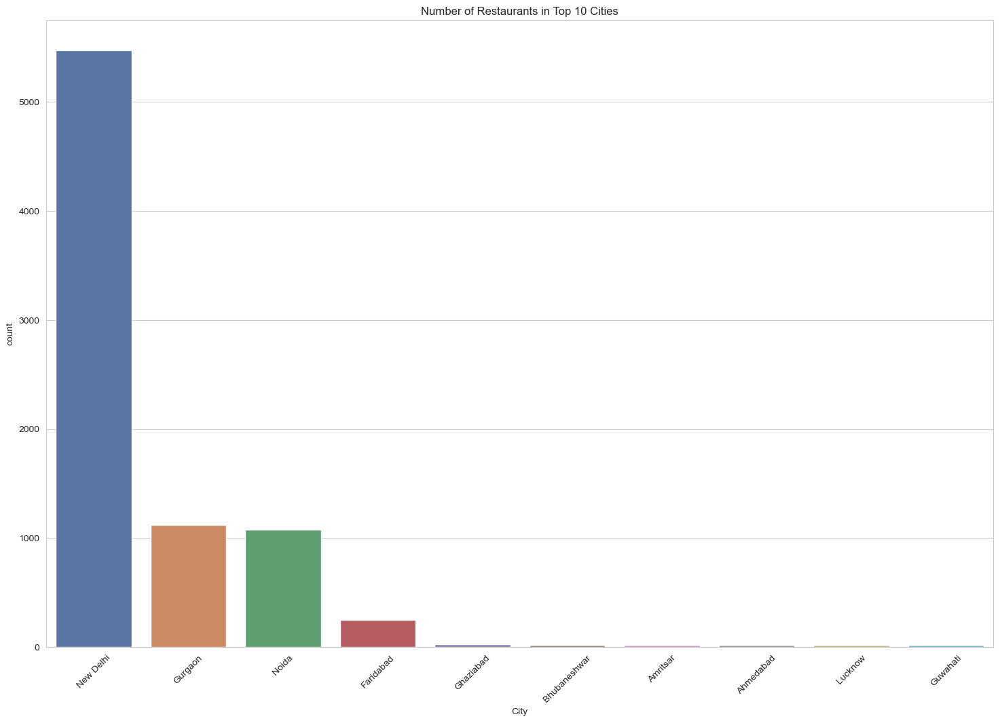

In [67]:
order_cities = join_data['City'].value_counts().head(10).index
join_data_order_cities = join_data[join_data['City'].isin(order_cities)]
plt.figure(figsize=(18, 12))
sns.countplot(x='City', data=join_data_order_cities, order=order_cities)
plt.title('Number of Restaurants in Top 10 Cities')
plt.xticks(rotation=45)
plt.show()


In [68]:
#We can see that New Delhi stands out with over 5000 restaurants

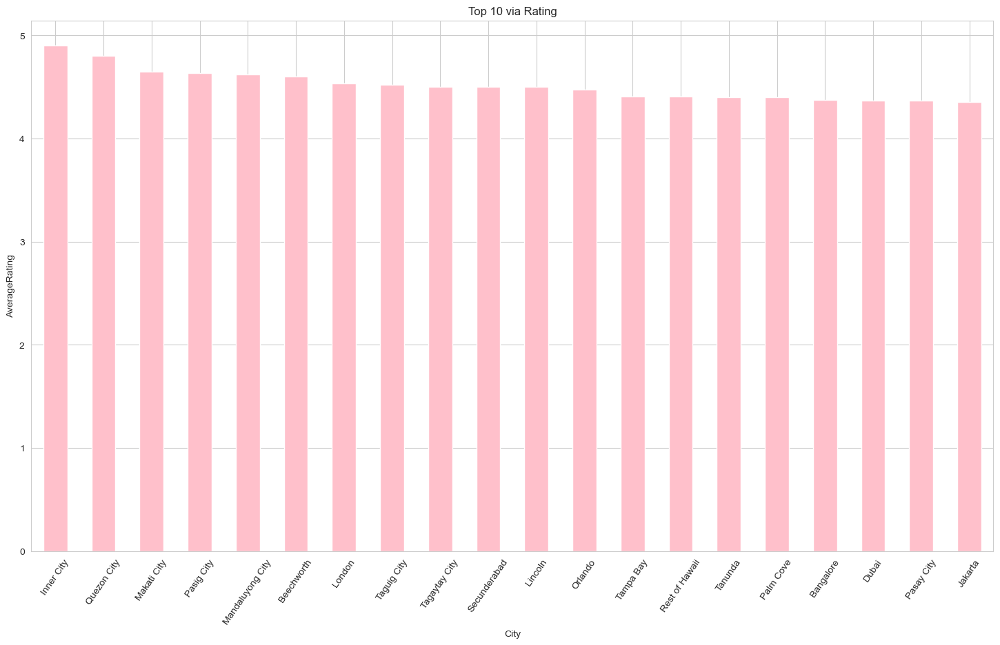

In [69]:
plt.figure(figsize=(18, 10))
join_data.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False).head(20).plot(kind='bar', color='pink')
plt.title('Top 10 via Rating')
plt.xlabel('City')
plt.ylabel('AverageRating')
plt.xticks(rotation=55)
plt.show()

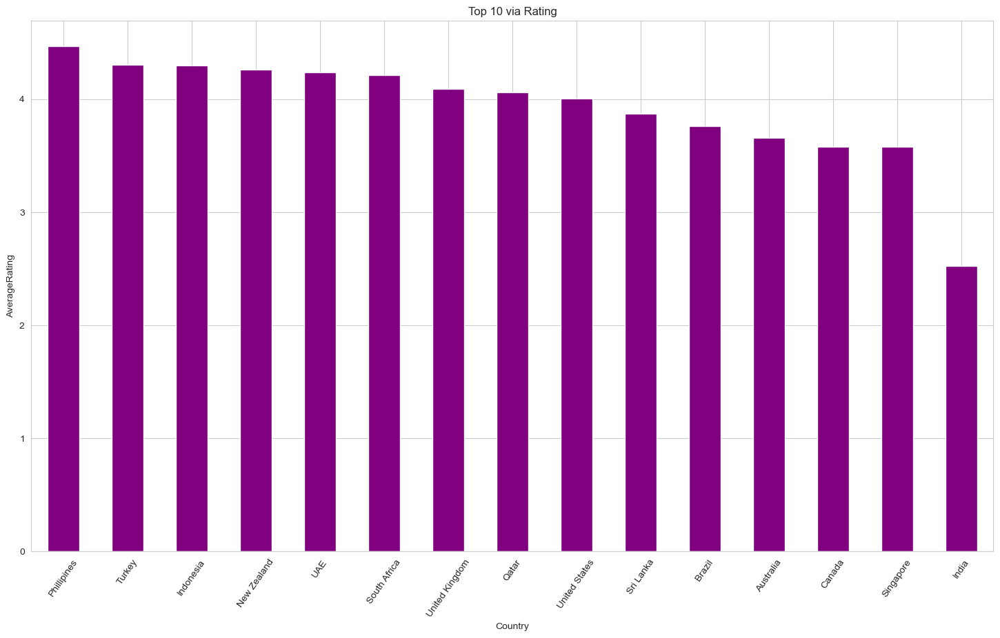

In [70]:
plt.figure(figsize=(18, 10))
join_data.groupby('Country')['Aggregate rating'].mean().sort_values(ascending=False).head(20).plot(kind='bar',color='purple')
plt.title('Top 10 via Rating')
plt.xlabel('Country')
plt.ylabel('AverageRating')
plt.xticks(rotation=55)
plt.show()

In [71]:
#Again, this is because the dataset has higher data from India 

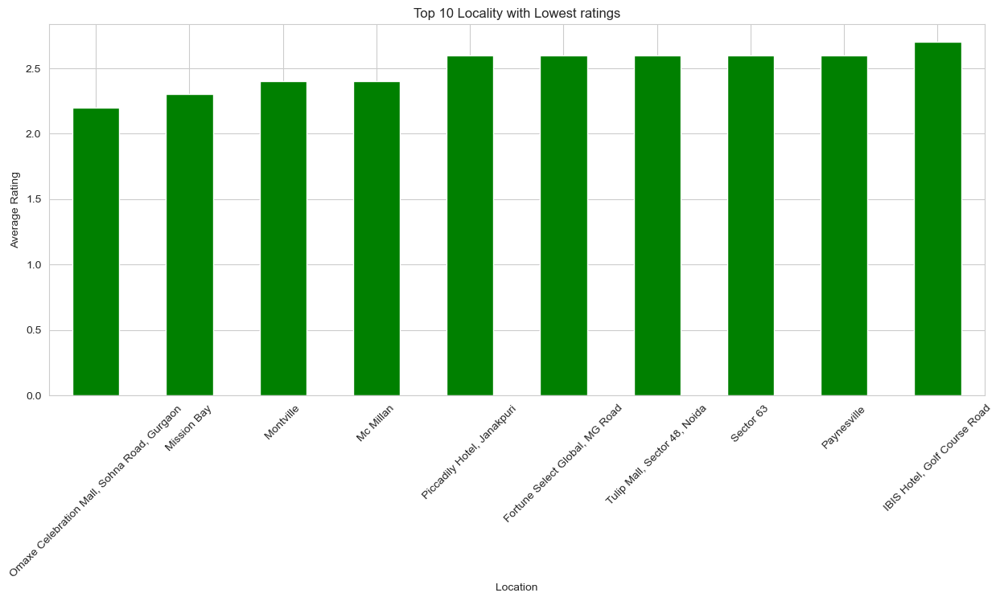

In [72]:
bad_ratings = join_data[join_data['Aggregate rating'] > 2]
bad_ratings_locations = bad_ratings.groupby('Locality')['Aggregate rating'].mean().sort_values().head(10)
bad_ratings_locations.plot(kind='bar', figsize=(15, 6), color='green')
plt.title('Top 10 Locality with Lowest ratings')
plt.xlabel('Location')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.show()

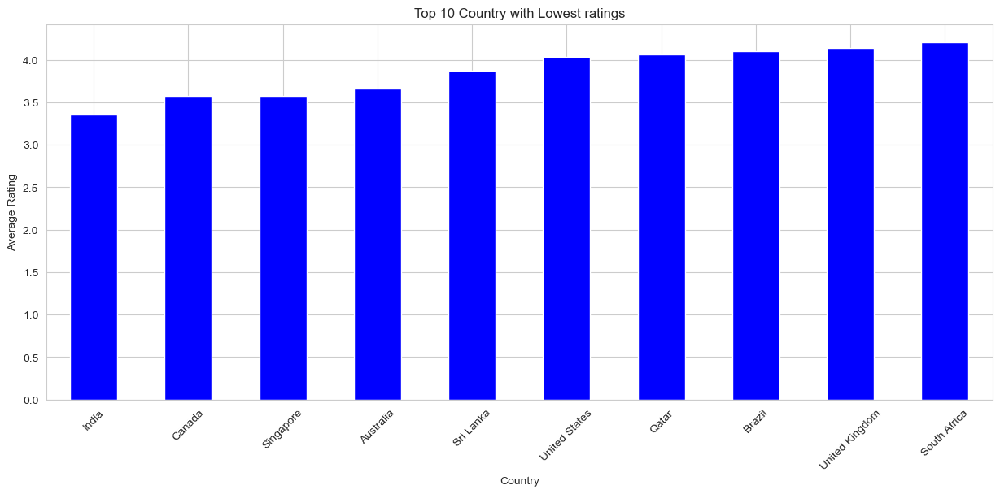

In [73]:
bad_ratings = join_data[join_data['Aggregate rating'] > 2]
bad_ratings_locations = bad_ratings.groupby('Country')['Aggregate rating'].mean().sort_values().head(10)
bad_ratings_locations.plot(kind='bar', figsize=(15, 6), color='blue')
plt.title('Top 10 Country with Lowest ratings')
plt.xlabel('Country')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.show()

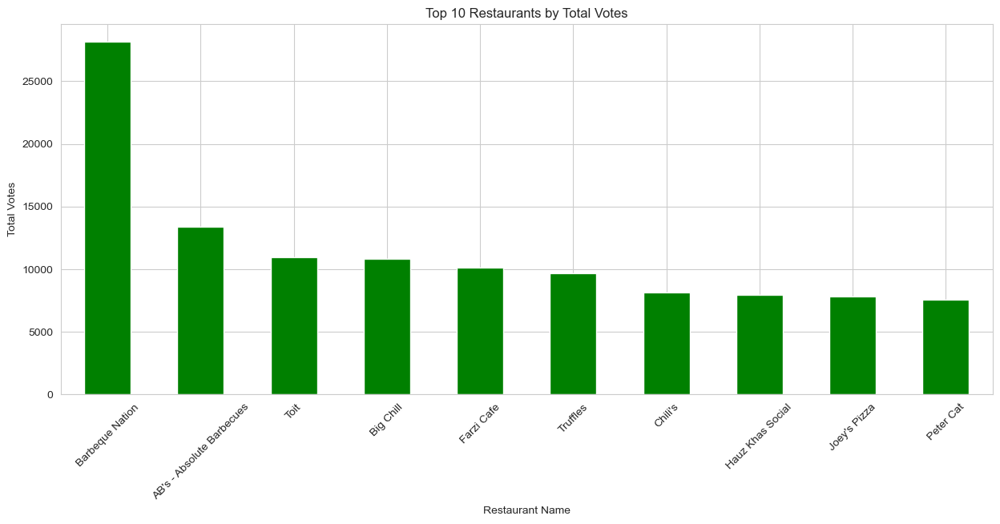

In [74]:
most_voted_restaurants = join_data.groupby('Restaurant Name')['Votes'].sum().sort_values(ascending=False).head(10)
most_voted_restaurants.plot(kind='bar', figsize=(15, 6), color='green')
plt.title('Top 10 Restaurants by Total Votes')
plt.xlabel('Restaurant Name')
plt.ylabel('Total Votes')
plt.xticks(rotation=45)
plt.show()

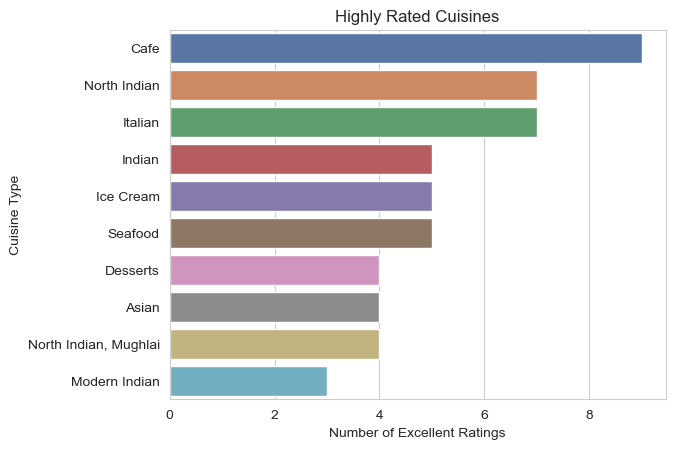

In [75]:
excellent_r_cuisines = join_data[join_data['Rating text']=='Excellent']
highr_cuisines_data = excellent_r_cuisines['Cuisines'].value_counts().head(10).reset_index()
highr_cuisines_data.columns = ['Cuisine Type', 'Frequency']
list = highr_cuisines_data['Cuisine Type'].to_list()
sns.barplot(y = 'Cuisine Type', x = 'Frequency', data = highr_cuisines_data)
plt.title('Highly Rated Cuisines')
plt.xlabel('Number of Excellent Ratings')
plt.ylabel('Cuisine Type')
plt.show()

In [76]:
#Here we can see that Cafe has been rate the best followed by North Indian

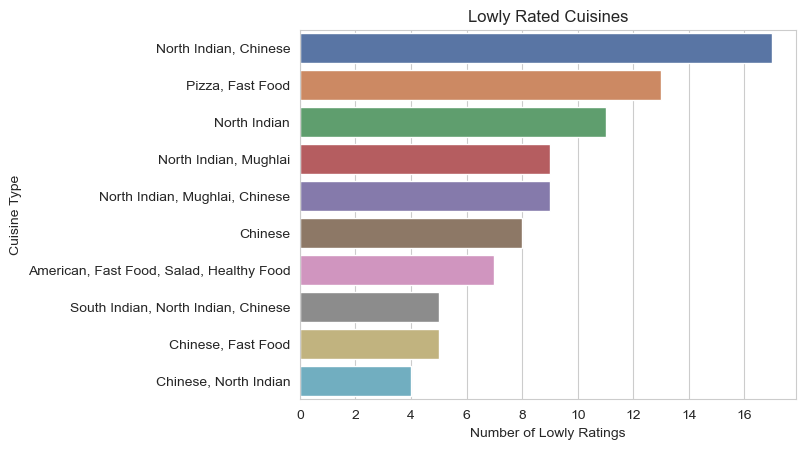

In [77]:
excellent_r_cuisines = join_data[join_data['Rating text']=='Poor']
highr_cuisines_data = excellent_r_cuisines['Cuisines'].value_counts().head(10).reset_index()
highr_cuisines_data.columns = ['Cuisine Type', 'Frequency']
list = highr_cuisines_data['Cuisine Type'].to_list()
sns.barplot(y = 'Cuisine Type', x = 'Frequency', data = highr_cuisines_data)
plt.title('Lowly Rated Cuisines')
plt.xlabel('Number of Lowly Ratings')
plt.ylabel('Cuisine Type')
plt.show()

In [78]:
#North Indian, Chinese is the most poorly rated! 

# Expensive Food (Average Cost for Two)

In [79]:
import plotly.express as px

In [80]:
Costly_food = join_data.nlargest(20, 'Average Cost for two')
fig = px.bar(Costly_food,x='Restaurant Name',y='Average Cost for two',color='City',title='Most Costly Restaurants')
fig.update_layout(bargap=0.4)
fig.show()

In [81]:
#We can see that expensive restaurant is in Jakarta. however it's worth noting that these data does not consider the currency exchange 

In [82]:
Costly_food = join_data.nlargest(20, 'Average Cost for two')
fig = px.bar(Costly_food,x='Restaurant Name',y='Average Cost for two',color='Country',title='Most Costly Restaurants')
fig.update_layout(bargap=0.4)
fig.show()

In [83]:
#In terms of country - it is Indonesia! however it's worth noting that these data does not consider the currency exchange 

In [84]:
cheap_food = join_data.nsmallest(10, 'Average Cost for two')
fig = px.bar(cheap_food,x='Restaurant Name',y='Average Cost for two',color='City',title='Cheap Restaurants')
fig.update_layout(bargap=0.4)
fig.show()

In [85]:
cheap_food = join_data.nsmallest(10, 'Average Cost for two')
fig = px.bar(cheap_food,x='Restaurant Name',y='Average Cost for two',color='Country',title='Cheap Restaurants')
fig.update_layout(bargap=0.4)
fig.show()

In [86]:
#Australia has the lowest cost for 2 - the price is only 7 dollars - however it's worth noting that these data does not consider the currency exchange 

In [87]:
#We can see that there are a lot of affordable restaurant

<Axes: xlabel='Rating text', ylabel='Price range'>

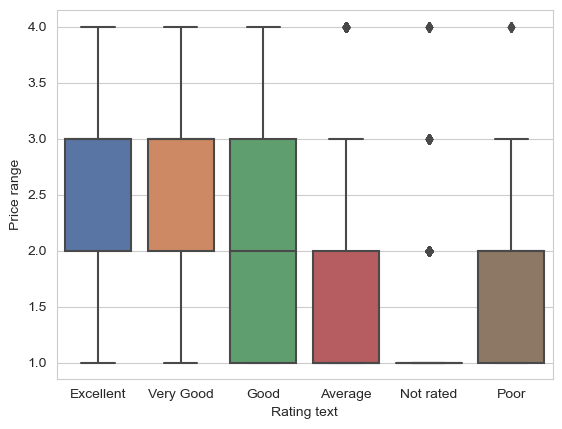

In [88]:
sns.boxplot(x='Rating text', y='Price range', data=join_data)

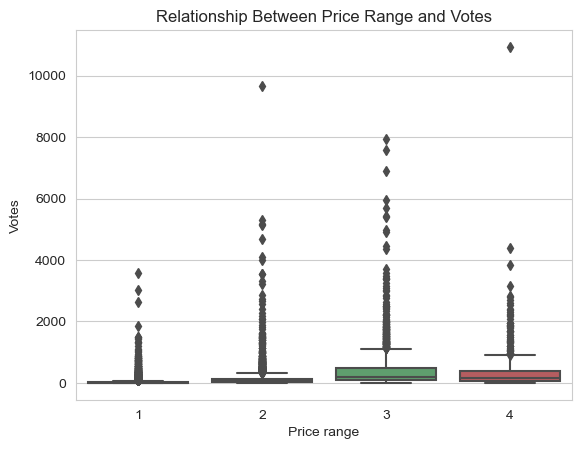

In [89]:
sns.boxplot(x='Price range', y='Votes', data=join_data)
plt.title('Relationship Between Price Range and Votes')
plt.show()

In [90]:
#We can see that majority of the votes are given to expensive restaurants howeever we can see that there are lot of outliers. 

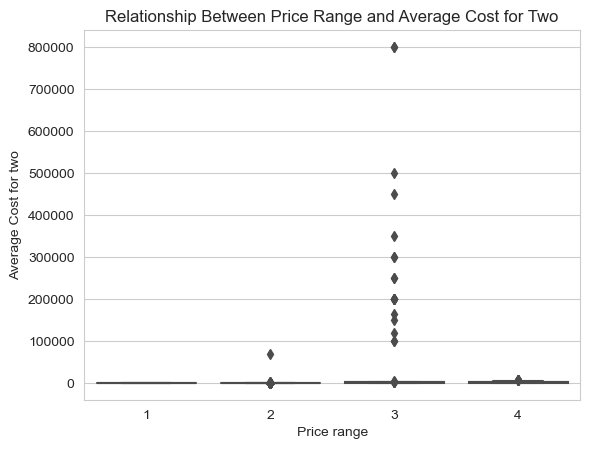

In [91]:
sns.boxplot(x='Price range', y='Average Cost for two', data=join_data)
plt.title('Relationship Between Price Range and Average Cost for Two')
plt.show()

In [73]:
#Here again, we can see outliers but we can also see that the average cost tends to increase when the price range increases 

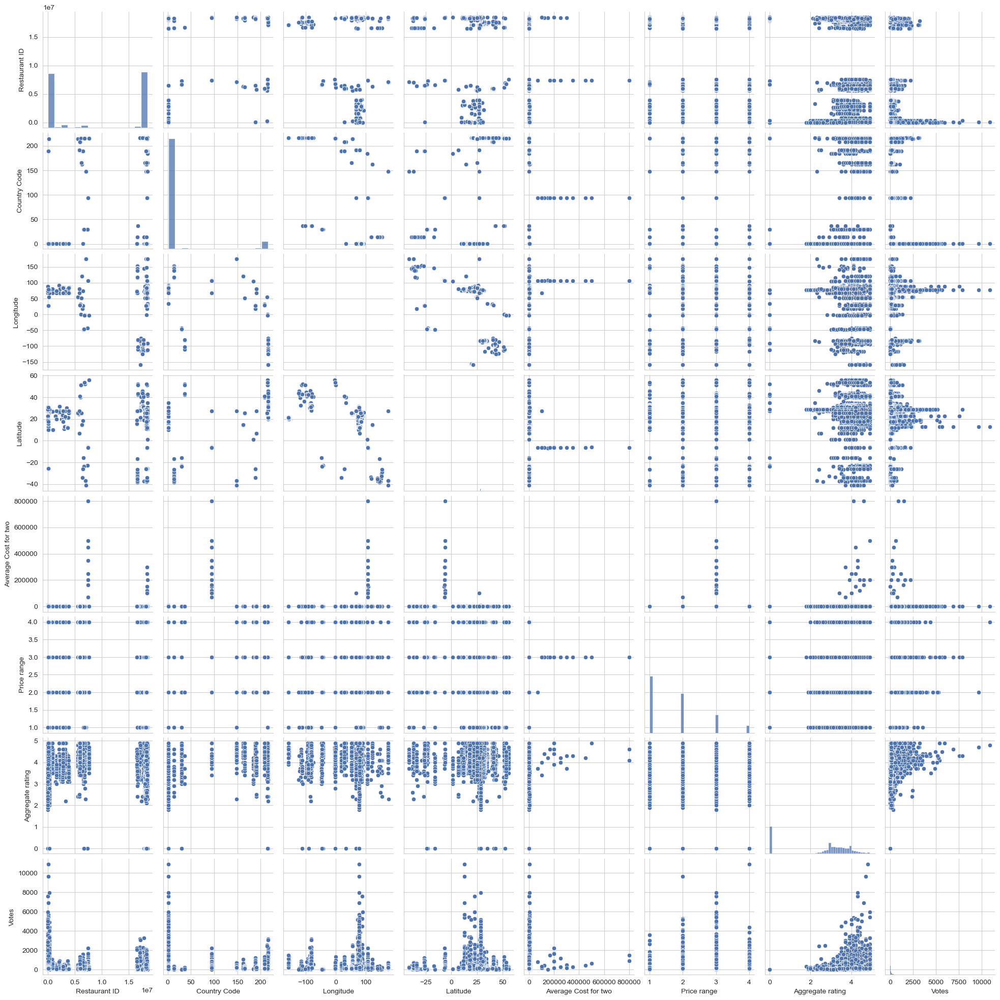

In [74]:
sns.pairplot(join_data)

<Axes: xlabel='Price range'>

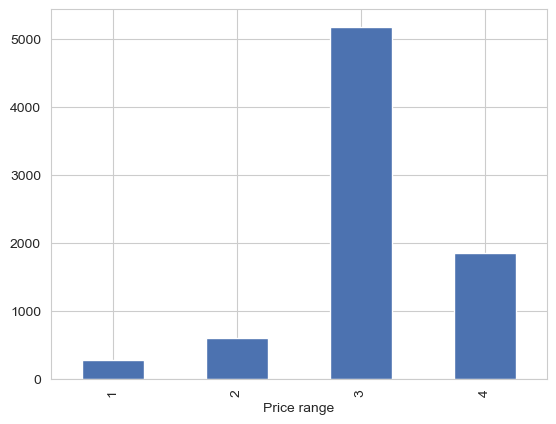

In [92]:
df.groupby('Price range')['Average Cost for two'].mean().plot(kind='bar')

<Axes: xlabel='Longitude', ylabel='Latitude'>

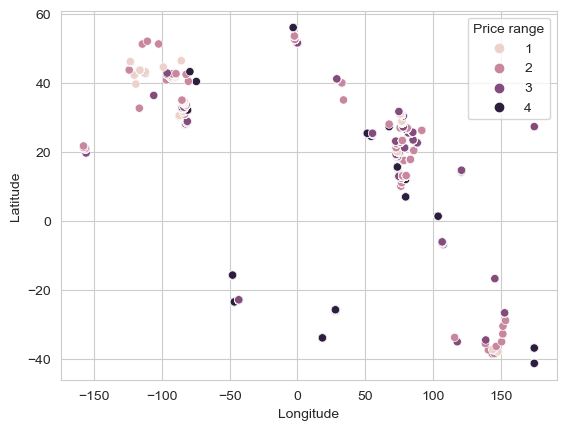

In [93]:
GEO_Analysis = join_data.groupby(['Latitude', 'Longitude', 'Price range']).size().reset_index(name='count')
sns.scatterplot(data=GEO_Analysis, x='Longitude', y='Latitude', hue='Price range')

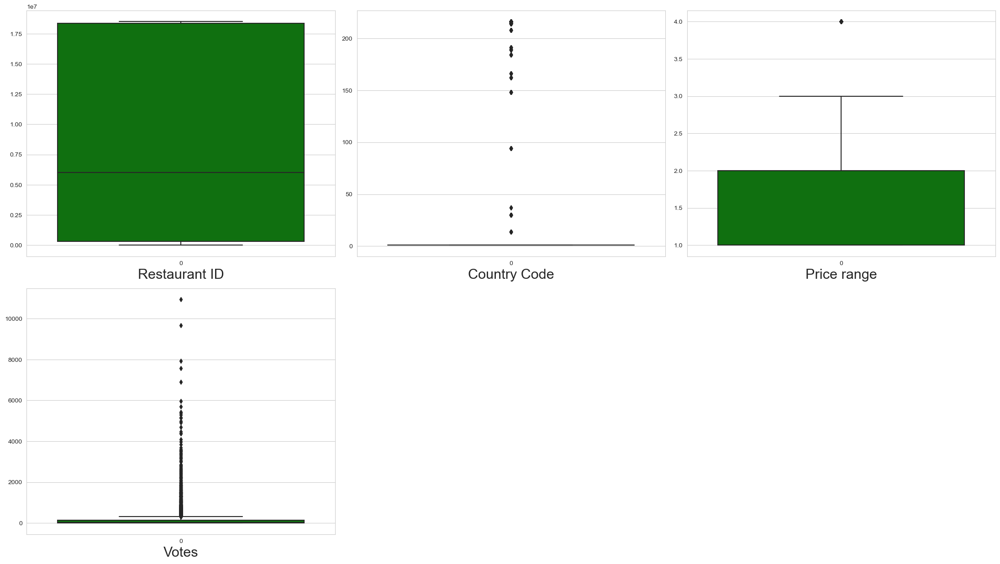

In [94]:
plt.figure(figsize=(22,18),facecolor='white')
PN=1
for n in num_col:
    if PN<=8:
        axis=plt.subplot(3,3,PN)
        sns.boxplot(join_data[n],color='g')
        plt.xlabel(n,fontsize=22)
    PN+=1
plt.tight_layout()

In [95]:
#Here we can see there are outliers in Votes, country code and price range 

<Axes: xlabel='Average Cost for two', ylabel='Density'>

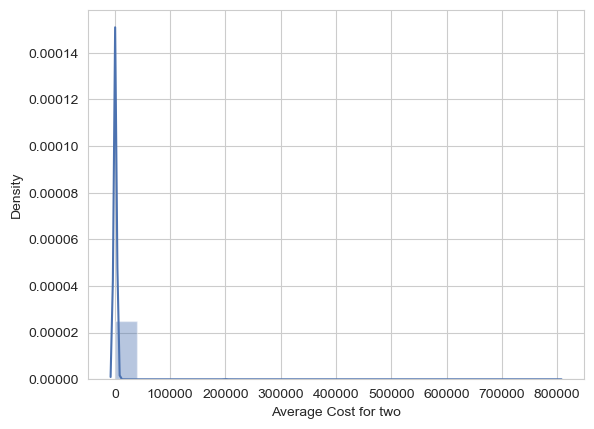

In [96]:
sns.distplot(join_data['Average Cost for two'], kde=True, bins=20)

In [97]:
#here we can see that Average Cost is rightly skewed 

In [98]:
join_data1=join_data.copy()

In [99]:
join_data1.shape

(9551, 23)

In [100]:
join_data1.size

219673

In [101]:
join_data.drop('Country Code', axis=1, inplace=True)


In [102]:
join_data.drop('Address', axis=1, inplace=True) #Our analysis is focused on pricing so we would not need this

In [103]:
join_data.drop('Switch to order menu', axis=1, inplace=True)

In [104]:
join_data.drop('Restaurant ID', axis=1, inplace=True) 
join_data.drop('Is delivering now', axis=1, inplace=True)
join_data.drop('Locality', axis=1, inplace=True) #We already have locality verbose 

In [121]:
Categorical_Data=['Has Online delivery','Has Table booking','Currency', 'Cuisines', 'Locality Verbose', 'City', 'Country', 'Restaurant Name', 'Rating text', 'Rating color']

In [122]:
from sklearn.preprocessing import LabelEncoder

In [123]:
LE = LabelEncoder()

In [124]:
for c in Categorical_Data:
    join_data[c] = LE.fit_transform(join_data[c])

In [125]:
join_data.head(10)

,Restaurant Name,City,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Price range,Aggregate rating,Rating color,Rating text,Votes,Country,Average Cost for twoB
0,3749,73,172,121.027535,14.565443,920,1100.0,0,1,0,3,4.8,0,1,314,6,1000-5000
1,3173,73,601,121.014101,14.553708,1111,1200.0,0,1,0,3,4.5,0,1,591,6,1000-5000
2,2897,75,314,121.056831,14.581404,1671,4000.0,0,1,0,4,4.4,1,5,270,6,1000-5000
3,4707,75,875,121.056475,14.585318,1126,1500.0,0,0,0,4,4.9,0,1,365,6,1000-5000
4,5523,75,875,121.057508,14.584450,1122,1500.0,0,1,0,4,4.8,0,1,229,6,1000-5000
5,2071,75,875,121.056314,14.583764,497,1000.0,0,0,0,3,4.4,1,5,336,6,500-1000
6,1007,94,876,120.979667,14.531333,134,2000.0,0,1,0,4,4.0,1,5,520,6,1000-5000
7,7179,94,876,120.979333,14.540000,1681,2000.0,0,1,0,4,4.2,1,5,677,6,1000-5000
8,6045,94,1054,120.980090,14.552990,796,6000.0,0,1,0,4,4.9,0,1,621,6,5000-10000
9,3812,95,522,121.056532,14.572041,892,1100.0,0,1,0,3,4.8,0,1,532,6,1000-5000


In [126]:
join_data.drop('Average Cost for twoB', axis=1, inplace=True) 

In [127]:
join_data2=join_data.copy

In [128]:
join_data.shape

(9551, 16)

In [129]:
join_data4=join_data.copy()
Q1 = join_data4.quantile(0.5)
Q3= join_data4.quantile(0.70)
IQR = Q3 - Q1

new = join_data4[((join_data4 < Q1 - (1.5 * IQR)) | (join_data4 > (Q3 + 1.5 * IQR ))).any(axis=1)]
print(new.shape)

(9529, 16)


In [130]:
Old = 9551
New= 9531
Data_Loss = ((Old - New) / Old) * 100
Overall_Data_Loss  = "Percentage Data Loss: {:.2f}%".format(Data_Loss)
print(Overall_Data_Loss)

Percentage Data Loss: 0.21%


In [131]:
new.corr()

,Restaurant Name,City,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
Restaurant Name,1.000000,-0.001722,0.004100,-0.008518,0.001763,0.051551,0.019290,0.009657,0.041495,0.028566,0.061157,0.028833,-0.008389,0.012044,0.018643,0.017788
City,-0.001722,1.000000,0.093015,0.123852,-0.009616,0.027913,-0.028845,-0.072034,-0.003405,0.013298,-0.105994,-0.132885,0.109824,-0.099128,-0.078258,-0.180744
Locality Verbose,0.004100,0.093015,1.000000,0.105622,0.000429,0.006405,-0.011843,0.022967,-0.065002,-0.031516,-0.112488,-0.173736,0.036550,-0.035510,-0.122895,-0.116351
Longitude,-0.008518,0.123852,0.105622,1.000000,-0.200056,0.138403,0.046353,0.365629,0.083700,0.141522,-0.106870,-0.195770,0.097377,-0.165040,-0.118867,-0.847004
Latitude,0.001763,-0.009616,0.000429,-0.200056,1.000000,0.033995,-0.138053,-0.115229,0.024307,0.055787,-0.236831,-0.118120,0.107536,-0.103744,-0.074304,0.175508
Cuisines,0.051551,0.027913,0.006405,0.138403,0.033995,1.000000,0.006026,0.073558,0.051903,-0.014596,-0.005291,-0.082868,-0.018178,-0.079855,-0.033227,-0.135975
Average Cost for two,0.019290,-0.028845,-0.011843,0.046353,-0.138053,0.006026,1.000000,0.045615,0.007717,-0.019048,0.075081,0.051896,-0.049949,0.031453,0.067767,-0.004060
Currency,0.009657,-0.072034,0.022967,0.365629,-0.115229,0.073558,0.045615,1.000000,0.000661,0.007027,0.075171,-0.006979,-0.040595,0.014592,-0.027103,-0.105290
Has Table booking,0.041495,-0.003405,-0.065002,0.083700,0.024307,0.051903,0.007717,0.000661,1.000000,0.100776,0.502216,0.190682,-0.020236,0.044157,0.169309,-0.062330
Has Online delivery,0.028566,0.013298,-0.031516,0.141522,0.055787,-0.014596,-0.019048,0.007027,0.100776,1.000000,0.078245,0.226786,0.013371,-0.080801,0.074100,-0.140909


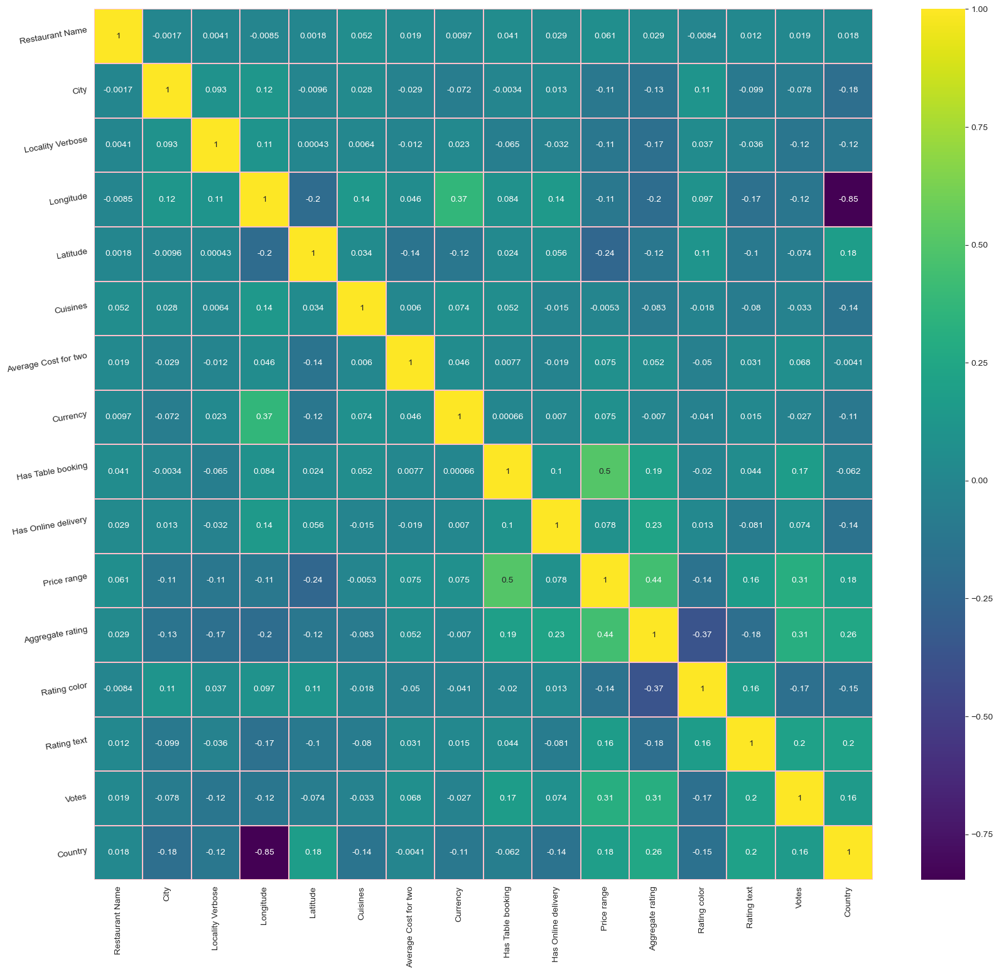

In [132]:
plt.figure(figsize=(20, 18))
sns.heatmap(new.corr(), linewidths=0.2, fmt=".2g", linecolor = "pink",annot = True,cmap="viridis")
plt.yticks(rotation=10);
plt.show()

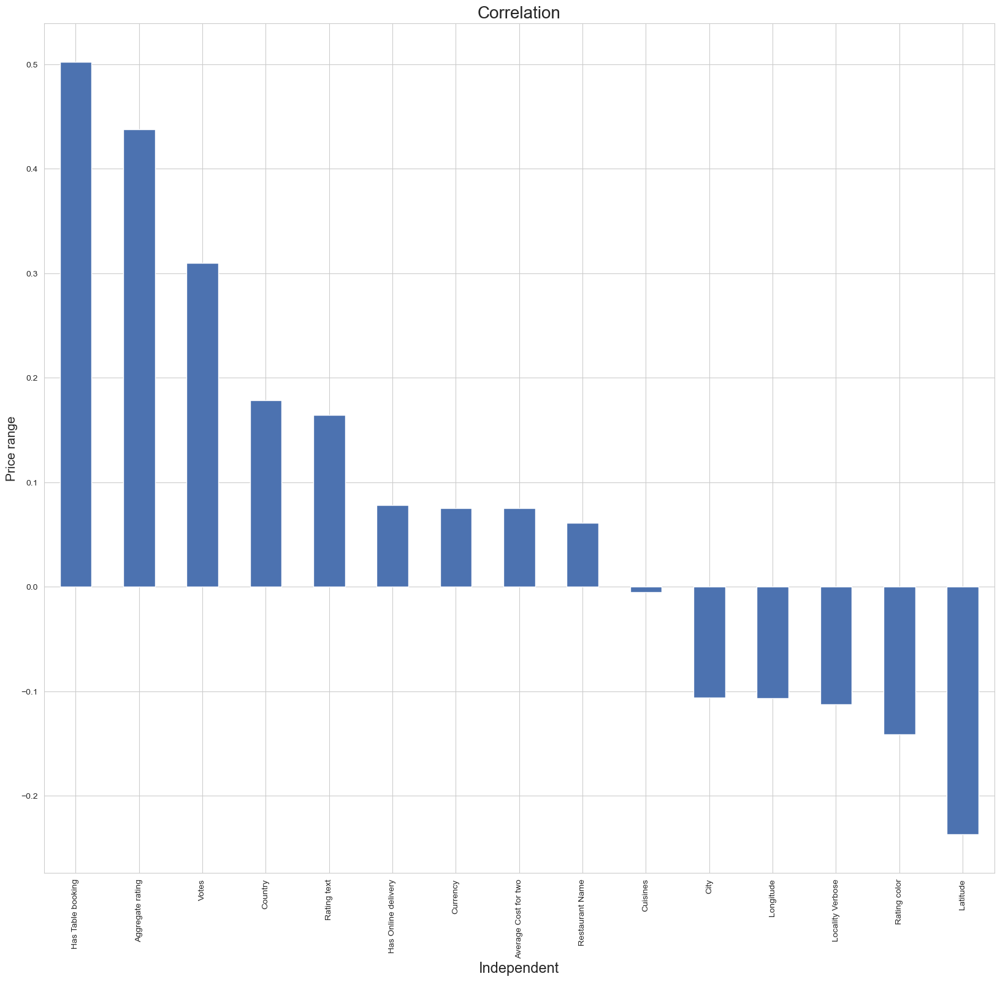

In [133]:
plt.figure(figsize = (20,18))
new.corr()['Price range'].sort_values(ascending=False).drop(['Price range']).plot(kind='bar')
plt.xlabel('Independent',fontsize=17)
plt.ylabel('Price range',fontsize=15)
plt.title('Correlation',fontsize = 20)
plt.show()

In [134]:
#We can see that table booking has a positive relationship with price_range followed by aggregate rating, votes, country, rating text, online delivery, currency, average cost for two, restaurant name, 
#poor relation with cuisine and delivering now
#Strong negative relation with lat, rating color, id, locality, locality verbose, long & city

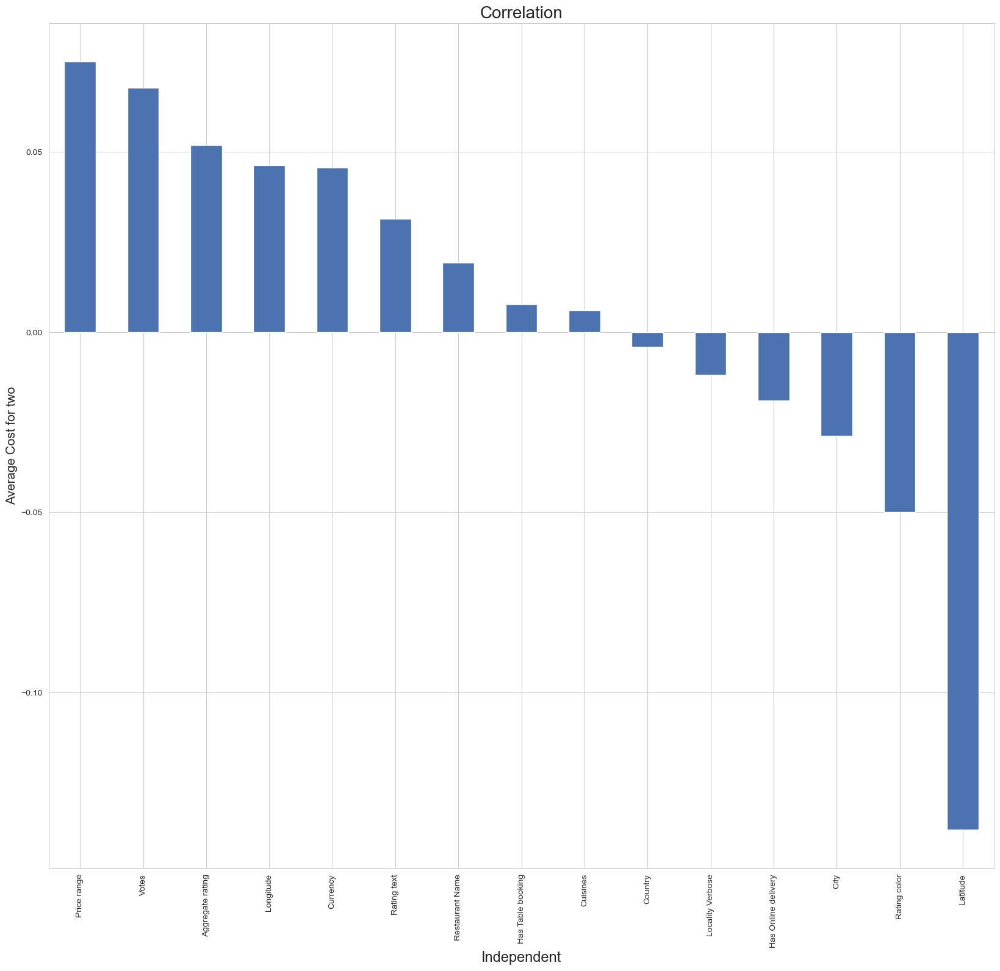

In [135]:
plt.figure(figsize = (20,18))
new.corr()['Average Cost for two'].sort_values(ascending=False).drop(['Average Cost for two']).plot(kind='bar')
plt.xlabel('Independent',fontsize=17)
plt.ylabel('Average Cost for two',fontsize=15)
plt.title('Correlation',fontsize = 20)
plt.show()

In [136]:
#Average cost for two - high positive with price range, votes, agg rating, long, currency, rating text,name, 
#a little less with table booking, cuisine, id, delivering now, country
#High negative with lat, rating color, city, has online, locality, locality verbose

In [137]:
new.skew()

Restaurant Name          0.045809
City                    -1.190399
Locality Verbose        -0.182674
Longitude               -3.500196
Latitude                -4.600886
Cuisines                -0.302342
Average Cost for two    35.437058
Currency                 2.854975
Has Table booking        2.317082
Has Online delivery      1.111069
Price range              0.890204
Aggregate rating        -0.950604
Rating color             0.049794
Rating text              0.431792
Votes                    8.797686
Country                  3.307916
dtype: float64

In [138]:
new['Average Cost for two'] = np.log(new['Average Cost for two'])
new['Votes'] = np.log(new['Votes'] + 1)

In [139]:
new.skew()

Restaurant Name         0.045809
City                   -1.190399
Locality Verbose       -0.182674
Longitude              -3.500196
Latitude               -4.600886
Cuisines               -0.302342
Average Cost for two   -0.410812
Currency                2.854975
Has Table booking       2.317082
Has Online delivery     1.111069
Price range             0.890204
Aggregate rating       -0.950604
Rating color            0.049794
Rating text             0.431792
Votes                  -0.027111
Country                 3.307916
dtype: float64

In [140]:
from scipy.stats import boxcox

In [141]:
new['Aggregate rating'] += 1 
new['Aggregate rating'], _ = boxcox(new['Aggregate rating'])

In [142]:
new.skew()

Restaurant Name         0.045809
City                   -1.190399
Locality Verbose       -0.182674
Longitude              -3.500196
Latitude               -4.600886
Cuisines               -0.302342
Average Cost for two   -0.410812
Currency                2.854975
Has Table booking       2.317082
Has Online delivery     1.111069
Price range             0.890204
Aggregate rating       -0.609666
Rating color            0.049794
Rating text             0.431792
Votes                  -0.027111
Country                 3.307916
dtype: float64

In [143]:
new23=new.copy()

In [144]:
independent = new.drop(['Average Cost for two'], axis=1)
dependent = new['Average Cost for two']

In [145]:
from sklearn.preprocessing import StandardScaler

In [146]:
Scaled= StandardScaler()
independent_scale = Scaled.fit_transform(independent)

In [147]:
from sklearn.linear_model import LinearRegression 
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor 
from sklearn.neighbors import KNeighborsRegressor as KNN
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import  Ridge
from sklearn.linear_model import  Lasso as Lasso
from sklearn.ensemble import AdaBoostRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import StackingRegressor

In [148]:
independent_train,independent_test,dependent_train,dependent_test = train_test_split(independent_scale, dependent, test_size = 0.30, random_state=40)

In [149]:
independent_train.shape

(6670, 15)

In [150]:
dependent_train.shape

(6670,)

In [151]:
independent_test.shape

(2859, 15)

In [152]:
dependent_test.shape

(2859,)

In [153]:
Highest_Accuracy = 0
True_random_state = 0
for r in range(1,300):
    independent_train,independent_test,dependent_train,dependent_test = train_test_split(independent, dependent, test_size = 0.20, random_state=r)
    LinearR = LinearRegression()
    LinearR.fit(independent_train, dependent_train)
    predictor=LinearR.predict(independent_test)
    initialscore = r2_score(dependent_test, predictor)
    if initialscore > Highest_Accuracy:
        Highest_Accuracy = initialscore
        True_random_state = r

print(f"True r2 Score: {Highest_Accuracy} at randomstate: {True_random_state}")

True r2 Score: 0.8136447438504648 at randomstate: 10


In [154]:
LinearR = LinearRegression()
LinearR.fit(independent_train, dependent_train)
predict_LinearR=LinearR.predict(independent_test)
pred_train=LinearR.predict(independent_train)
print('r2_score:', r2_score (dependent_test, predict_LinearR))
print('r2_score on given training data:',r2_score(dependent_train, pred_train)*100)
print('MAE:', mean_absolute_error(dependent_test, predict_LinearR))
print('MSE:', mean_squared_error(dependent_test, predict_LinearR))
print('RSE:', np.sqrt(mean_squared_error(dependent_test, predict_LinearR)))

r2_score: 0.7715986117565008
r2_score on given training data: 74.74705577191726
MAE: 0.3026808859665817
MSE: 0.2400722510774667
RSE: 0.48997168395476354


In [155]:
KNNmodel = KNN(n_neighbors=5)
KNNmodel.fit(independent_train, dependent_train)
predict_KNNmodel=KNNmodel.predict(independent_test)
pred_train=KNNmodel.predict(independent_train)
print('r2_score:', r2_score (dependent_test, predict_KNNmodel))
print('r2_score on given training data:',r2_score(dependent_train, pred_train)*100)
print('MAE:', mean_absolute_error(dependent_test, predict_KNNmodel))
print('MSE:', mean_squared_error(dependent_test, predict_KNNmodel))
print('RSE:', np.sqrt(mean_squared_error(dependent_test, predict_KNNmodel)))

r2_score: 0.19049688406696397
r2_score on given training data: 46.57024896148516
MAE: 0.646560319564273
MSE: 0.8508671369767767
RSE: 0.9224245969057724


In [156]:
decisiontreeR = DecisionTreeRegressor(criterion = 'squared_error')
decisiontreeR.fit(independent_train, dependent_train)
predict_decisiontreeR=decisiontreeR.predict(independent_test)
pred_train=decisiontreeR.predict(independent_train)
print('r2_score:', r2_score (dependent_test, predict_decisiontreeR))
print('r2_score on given training data:',r2_score(dependent_train, pred_train)*100)
print('MAE:', mean_absolute_error(dependent_test, predict_decisiontreeR))
print('MSE:', mean_squared_error(dependent_test, predict_decisiontreeR))
print('RSE:', np.sqrt(mean_squared_error(dependent_test, predict_decisiontreeR)))

r2_score: 0.8547211437357939
r2_score on given training data: 100.0
MAE: 0.2601946405204514
MSE: 0.15270232079379828
RSE: 0.3907714431656928


In [157]:
SGDR = SGDRegressor()
SGDR.fit(independent_train, dependent_train)
predict_SGDR=SGDR.predict(independent_test)
pred_train=SGDR.predict(independent_train)
print('r2_score:', r2_score (dependent_test, predict_SGDR))
print('r2_score on given training data:',r2_score(dependent_train, pred_train)*100)
print('MAE:', mean_absolute_error(dependent_test, predict_SGDR))
print('MSE:', mean_squared_error(dependent_test, predict_SGDR))
print('RSE:', np.sqrt(mean_squared_error(dependent_test, predict_SGDR)))

r2_score: -2.450754837256171e+31
r2_score on given training data: -2.2900871941492808e+33
MAE: 4396757065740052.5
MSE: 2.5759836012547764e+31
RSE: 5075414861126897.0


In [158]:
Lasso = Lasso()
Lasso.fit(independent_train, dependent_train)
predict_Lasso=Lasso.predict(independent_test)
pred_train=Lasso.predict(independent_train)
print('r2_score:', r2_score (dependent_test, predict_Lasso))
print('r2_score on given training data:',r2_score(dependent_train, pred_train)*100)
print('MAE:', mean_absolute_error(dependent_test, predict_Lasso))
print('MSE:', mean_squared_error(dependent_test, predict_Lasso))
print('RSE:', np.sqrt(mean_squared_error(dependent_test, predict_Lasso)))

r2_score: 0.37170235045806466
r2_score on given training data: 34.603928915198765
MAE: 0.5910604945683341
MSE: 0.6604024267637383
RSE: 0.8126514792724728


In [159]:
rg = Ridge()
rg.fit(independent_train, dependent_train)
predict_rg=rg.predict(independent_test)
pred_train=rg.predict(independent_train)
print('r2_score:', r2_score (dependent_test, predict_rg))
print('r2_score on given training data:',r2_score(dependent_train, pred_train)*100)
print('MAE:', mean_absolute_error(dependent_test, predict_rg))
print('MSE:', mean_squared_error(dependent_test, predict_rg))
print('RSE:', np.sqrt(mean_squared_error(dependent_test, predict_rg)))

r2_score: 0.7716030514201538
r2_score on given training data: 74.74705443101126
MAE: 0.302670674492819
MSE: 0.24006758455571117
RSE: 0.4899669218995413


In [160]:
GBregressor=GradientBoostingRegressor()
GBregressor.fit(independent_train, dependent_train)
predict_GBregressor=GBregressor.predict(independent_test)
pred_train=GBregressor.predict(independent_train)
print('r2_score:', r2_score (dependent_test, predict_GBregressor))
print('r2_score on given training data:',r2_score(dependent_train, pred_train)*100)
print('MAE:', mean_absolute_error(dependent_test, predict_GBregressor))
print('MSE:', mean_squared_error(dependent_test, predict_GBregressor))
print('RSE:', np.sqrt(mean_squared_error(dependent_test, predict_GBregressor)))

r2_score: 0.9170017100853717
r2_score on given training data: 92.60606187260393
MAE: 0.22168987399224963
MSE: 0.08723933969325227
RSE: 0.2953630641993888


In [161]:
supportVR=SVR(kernel='rbf')
supportVR.fit(independent_train, dependent_train)
predict_supportVR=supportVR.predict(independent_test)
pred_train=supportVR.predict(independent_train)
print('r2_score:', r2_score (dependent_test, predict_supportVR))
print('r2_score on given training data:',r2_score(dependent_train, pred_train)*100)
print('MAE:', mean_absolute_error(dependent_test, predict_supportVR))
print('MSE:', mean_squared_error(dependent_test, predict_supportVR))
print('RSE:', np.sqrt(mean_squared_error(dependent_test, predict_supportVR)))

r2_score: 0.19764434339177261
r2_score on given training data: 19.439270673670418
MAE: 0.6640720425814536
MSE: 0.8433544565032145
RSE: 0.9183433216957667


In [162]:
RandomFR=RandomForestRegressor()
RandomFR.fit(independent_train, dependent_train)
predict_RandomFR=RandomFR.predict(independent_test)
pred_train=RandomFR.predict(independent_train)
print('r2_score:', r2_score (dependent_test, predict_RandomFR))
print('r2_score on given training data:',r2_score(dependent_train, pred_train)*100)
print('MAE:', mean_absolute_error(dependent_test, predict_RandomFR))
print('MSE:', mean_squared_error(dependent_test, predict_RandomFR))
print('RSE:', np.sqrt(mean_squared_error(dependent_test, predict_RandomFR)))

r2_score: 0.9250156807578965
r2_score on given training data: 98.91594775895305
MAE: 0.2008706366298067
MSE: 0.0788158708421315
RSE: 0.2807416442961954


In [163]:
XtraTR=ExtraTreesRegressor()
XtraTR.fit(independent_train, dependent_train)
predict_XtraTR=XtraTR.predict(independent_test)
pred_train=XtraTR.predict(independent_train)
print('r2_score:', r2_score (dependent_test, predict_XtraTR))
print('r2_score on given training data:',r2_score(dependent_train, pred_train)*100)
print('MAE:', mean_absolute_error(dependent_test, predict_XtraTR))
print('MSE:', mean_squared_error(dependent_test, predict_XtraTR))
print('RSE:', np.sqrt(mean_squared_error(dependent_test, predict_XtraTR)))

r2_score: 0.917487143387333
r2_score on given training data: 100.0
MAE: 0.21008379381919323
MSE: 0.08672910170194212
RSE: 0.29449805042129246


In [164]:
score = cross_val_score(decisiontreeR,independent,dependent, scoring='r2')
print(score)
print(score.mean())

[-3.7395136   0.71884084  0.64113775  0.73383989  0.02780486]
-0.3235780529068192


In [165]:
score = cross_val_score(SGDR,independent,dependent, scoring='r2')
print(score)
print(score.mean())

[-5.35148822e+29 -5.52361664e+30 -2.81353029e+31 -1.49001436e+31
 -3.79603788e+30]
-1.0578049963180887e+31


In [166]:
score = cross_val_score(Lasso,independent,dependent, scoring='r2')
print(score)
print(score.mean())

[ 0.39622057 -0.05950175 -0.0319325  -0.00575894  0.07928496]
0.0756624703652025


In [167]:
score = cross_val_score(rg,independent,dependent, scoring='r2')
print(score)
print(score.mean())

[0.55778112 0.80237863 0.75383419 0.78478695 0.16461271]
0.6126787212011336


In [168]:
score = cross_val_score(GBregressor,independent,dependent, scoring='r2')
print(score)
print(score.mean())

[0.53384687 0.84835847 0.80576413 0.83716982 0.0481988 ]
0.6146676174848393


In [169]:
score = cross_val_score(supportVR,independent,dependent, scoring='r2')
print(score)
print(score.mean())

[-0.12206643 -0.12460086 -0.02657012 -0.00071998  0.05936776]
-0.04291792559919396


In [170]:
score = cross_val_score(RandomFR,independent,dependent, scoring='r2')
print(score)
print(score.mean())

[0.3371961  0.85808636 0.82229128 0.85565335 0.13338605]
0.6013226300412893


In [171]:
score = cross_val_score(XtraTR,independent,dependent, scoring='r2')
print(score)
print(score.mean())

[0.37317968 0.85357172 0.80831842 0.84725437 0.3997822 ]
0.6564212790719675


In [ ]:
#Random Forest is the best model so far!

In [149]:
from sklearn.model_selection import GridSearchCV

In [152]:
param_1 = {
    'n_estimators': [100, 200, 300],
    'max_depth': [1,2,3],
    'min_samples_split': [5,6],
    'min_samples_leaf': [1,2],
    'max_features': ['sqrt', 'log2', None]
}

In [153]:
gcv=GridSearchCV(RandomForestRegressor(),param_1,cv=5)
gcv.fit(independent_train, dependent_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [1, 2, 3],
                         'max_features': ['sqrt', 'log2', None],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [5, 6],
                         'n_estimators': [100, 200, 300]})

In [154]:
best_params = gcv.best_params_
print("Perfect Parameters:", best_params)

Perfect Parameters: {'max_depth': 3, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300}


In [158]:
Finalmodel=RandomForestRegressor(max_depth= 3, max_features = None, min_samples_leaf= 2, min_samples_split= 5, n_estimators= 30)

In [ ]:
import joblib
joblib.dump(Finalmodel,'Average_cost_for_two.pkl')

In [172]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,f1_score

In [173]:
new23

,Restaurant Name,City,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,3749,73,172,121.027535,14.565443,920,7.003065,0,1,0,3,11.942443,0,1,5.752573,6
1,3173,73,601,121.014101,14.553708,1111,7.090077,0,1,0,3,10.826943,0,1,6.383507,6
2,2897,75,314,121.056831,14.581404,1671,8.294050,0,1,0,4,10.465129,1,5,5.602119,6
3,4707,75,875,121.056475,14.585318,1126,7.313220,0,0,0,4,12.324224,0,1,5.902633,6
4,5523,75,875,121.057508,14.584450,1122,7.313220,0,1,0,4,11.942443,0,1,5.438079,6
5,2071,75,875,121.056314,14.583764,497,6.907755,0,0,0,3,10.465129,1,5,5.820083,6
6,1007,94,876,120.979667,14.531333,134,7.600902,0,1,0,4,9.068564,1,5,6.255750,6
7,7179,94,876,120.979333,14.540000,1681,7.600902,0,1,0,4,9.756661,1,5,6.519147,6
8,6045,94,1054,120.980090,14.552990,796,8.699515,0,1,0,4,12.324224,0,1,6.432940,6
9,3812,95,522,121.056532,14.572041,892,7.003065,0,1,0,3,11.942443,0,1,6.278521,6


In [175]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif= pd.DataFrame()
vif['VIF']= [variance_inflation_factor(new23.values,i) for i in range(new23.shape[1])]
vif['Features']= new23.columns
vif

,VIF,Features
0,3.895099,Restaurant Name
1,11.661019,City
2,5.310912,Locality Verbose
3,19.650961,Longitude
4,13.473963,Latitude
5,4.786611,Cuisines
6,76.137254,Average Cost for two
7,28.555581,Currency
8,1.645297,Has Table booking
9,1.617025,Has Online delivery


In [179]:
vif= pd.DataFrame()
vif['VIF']= [variance_inflation_factor(new23.values,i) for i in range(new23.shape[1])]
vif['Features']= new23.columns
vif

,VIF,Features
0,3.893179,Restaurant Name
1,11.595540,City
2,5.296130,Locality Verbose
3,13.367468,Latitude
4,4.773915,Cuisines
5,64.738970,Average Cost for two
6,20.817710,Currency
7,1.645195,Has Table booking
8,1.616384,Has Online delivery
9,13.974780,Price range


In [181]:
new23.drop(columns=['Latitude'],axis=1,inplace=True)

In [182]:
vif= pd.DataFrame()
vif['VIF']= [variance_inflation_factor(new23.values,i) for i in range(new23.shape[1])]
vif['Features']= new23.columns
vif

,VIF,Features
0,3.892520,Restaurant Name
1,11.595244,City
2,5.296074,Locality Verbose
3,4.749929,Cuisines
4,48.371138,Average Cost for two
5,20.583927,Currency
6,1.611560,Has Table booking
7,1.604061,Has Online delivery
8,11.422534,Price range
9,17.458449,Aggregate rating


In [183]:
new23['Price range'].value_counts()

Price range
1    4444
2    3091
3    1408
4     586
Name: count, dtype: int64

In [184]:
#Imbalance

In [185]:
from imblearn.over_sampling import SMOTE

In [186]:
A = new23.drop(['Price range'], axis =1)
B = new23['Price range']

In [187]:
sample=SMOTE()
A, B = sample.fit_resample(A, B)

In [188]:
B.value_counts()

Price range
3    4444
4    4444
2    4444
1    4444
Name: count, dtype: int64

In [189]:
Scale= StandardScaler()
A_scale = Scale.fit_transform(A)

In [190]:
from sklearn.decomposition import PCA

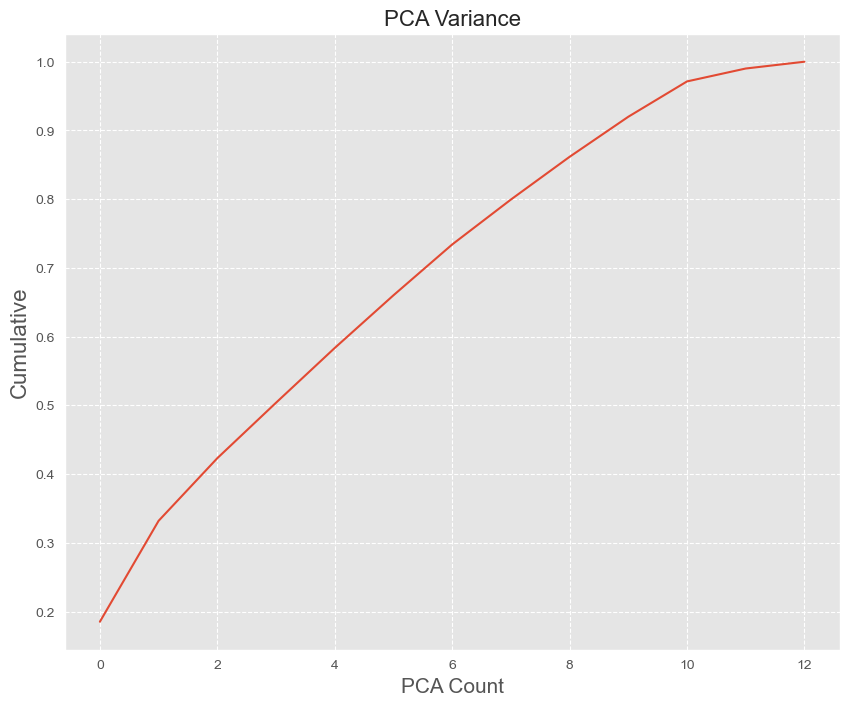

In [191]:
Pca = PCA()
PCA1 = Pca.fit_transform(A_scale)
plt.figure(figsize=(10, 8))
plt.style.use('ggplot')
plt.plot(np.cumsum(Pca.explained_variance_ratio_))
plt.xlabel('PCA Count', fontsize=15)
plt.ylabel('Cumulative', fontsize=16)
plt.title('PCA Variance', fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.8)
plt.show()

In [192]:
New_PCA1 = PCA(n_components=9)
A_new = New_PCA1.fit_transform(A_scale)

In [193]:
Final1=pd.DataFrame(A_new,columns=np.arange(9))

In [203]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier 
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
from sklearn.metrics import roc_curve, auc, RocCurveDisplay

In [195]:
A_train, A_test, B_train, B_test = train_test_split(Final1, B, random_state=40, test_size=.25)

In [196]:
A_train.shape

(13332, 9)

In [197]:
B_train.shape

(13332,)

In [198]:
A_test.shape

(4444, 9)

In [199]:
B_test.shape

(4444,)

In [200]:
Accuracy = 0
random_state = 0
for r in range(1,100):
    A_train,A_test,B_train,B_test = train_test_split(Final1, B, test_size = 0.40, random_state=r)
    modelDT = DecisionTreeClassifier()
    modelDT.fit(A_train, B_train)
    predictor=modelDT.predict(A_test)
    initialscore = accuracy_score(B_test, predictor)
    if initialscore > Accuracy:
        Accuracy = initialscore
        random_state = r
print("True Accuracy Score: ", Accuracy, "at randomstate:", random_state)

True Accuracy Score:  0.7512304879763746 at randomstate: 15


In [201]:
Accuracy = 0
random_state = 0
for r in range(1,100):
    A_train,A_test,B_train,B_test = train_test_split(A, B, test_size = 0.40, random_state=r)
    BC = BaggingClassifier()
    BC.fit(A_train, B_train)
    predictor=BC.predict(A_test)
    initialscore = accuracy_score(B_test, predictor)
    if initialscore > Accuracy:
        Accuracy = initialscore
        random_state = r
print("True Accuracy Score: ", Accuracy, "at randomstate:", random_state)

True Accuracy Score:  0.9502179721558149 at randomstate: 22


In [205]:
models = {
    'DT': DecisionTreeClassifier(min_samples_split=2, max_depth=None, min_samples_leaf=2, random_state=r),
    'BC': BaggingClassifier(n_estimators=10, max_features=1.0, max_samples=1.0,  random_state=42),
    'RF': RandomForestClassifier(n_estimators=100, max_depth=None, min_samples_leaf=1, min_samples_split=2, random_state=r),
    'AB': AdaBoostClassifier(n_estimators=100, learning_rate=1.0, random_state=r),
    'ET': ExtraTreesClassifier(n_estimators=100, criterion='gini', min_samples_split=2, min_samples_leaf=1, random_state=r),
    'GB': GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, min_samples_leaf=1,max_depth=2, min_samples_split=2,  random_state=r),
    'KNN': KNeighborsClassifier(n_neighbors=5, algorithm='auto', weights='uniform'),
    'SVC': SVC(kernel='rbf', gamma='scale', C=1.0,  random_state=r),
    'LR': LogisticRegression(C=1.0, penalty='l2', max_iter=100, random_state=r)}


def test_models(models, A_train, A_test, B_train, B_test):
    for title, m in models.items():
        m.fit(A_train, B_train)
        predresults = m.predict(A_test)
        acc = accuracy_score(B_test, predresults)
        c_matrix = confusion_matrix(B_test, predresults)
        classification_r = classification_report(B_test, predresults)
        print(f"output for {title}:")
        print(f"Overall Accuracy: {acc}")
        print("Confusion Matrix:")
        print(c_matrix)
        print("Classification Report:")
        print(classification_r)
        print("\n")
        

test_models(models, A_train, A_test, B_train, B_test)

output for DT:
Overall Accuracy: 0.926873857404022
Confusion Matrix:
[[1781   17    3    1]
 [  15 1682   68   18]
 [   5   74 1571  144]
 [   0   28  147 1557]]
Classification Report:
              precision    recall  f1-score   support

           1       0.99      0.99      0.99      1802
           2       0.93      0.94      0.94      1783
           3       0.88      0.88      0.88      1794
           4       0.91      0.90      0.90      1732

    accuracy                           0.93      7111
   macro avg       0.93      0.93      0.93      7111
weighted avg       0.93      0.93      0.93      7111



output for BC:
Overall Accuracy: 0.9459991562368162
Confusion Matrix:
[[1791   11    0    0]
 [  15 1702   51   15]
 [   5   50 1611  128]
 [   0   11   98 1623]]
Classification Report:
              precision    recall  f1-score   support

           1       0.99      0.99      0.99      1802
           2       0.96      0.95      0.96      1783
           3       0.92      

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score, StratifiedKFold

In [206]:
list_of_classifiers = {'DT': DecisionTreeClassifier(min_samples_split=2, max_depth=None, min_samples_leaf=2, random_state=r),
    'BC': BaggingClassifier(n_estimators=10, max_features=1.0, max_samples=1.0,  random_state=42),
    'RF': RandomForestClassifier(n_estimators=100, max_depth=None, min_samples_leaf=1, min_samples_split=2, random_state=r),
    'AB': AdaBoostClassifier(n_estimators=100, learning_rate=1.0, random_state=r),
    'ET': ExtraTreesClassifier(n_estimators=100, criterion='gini', min_samples_split=2, min_samples_leaf=1, random_state=r),
    'GB': GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, min_samples_leaf=1,max_depth=2, min_samples_split=2,  random_state=r),
    'KNN': KNeighborsClassifier(n_neighbors=5, algorithm='auto', weights='uniform'),
    'SVC': SVC(kernel='rbf', gamma='scale', C=1.0,  random_state=r),
    'LR': LogisticRegression(C=1.0, penalty='l2', max_iter=100, random_state=r)
                      }

Output = {}

for name, c in list_of_classifiers.items():
    cvs = cross_val_score(c, A, B, cv=5)
    c.fit(A_train, B_train)
    predict_test = c.predict(A_test)
    accuracy_testing = accuracy_score(B_test, predict_test)
    mcv_testcv_difference = accuracy_testing - cvs.mean()
    Output[name] = {
        'Cross Validation Scores': cvs,
        'Mean of Cross Validation Scores': cvs.mean(),
        'Accuracy of the test': accuracy_testing,
        'Overall difference': mcv_testcv_difference}

for name, m in Output.items():
    print(f"{name}:")
    print(f"Cross-Validation Scores: {m['Cross Validation Scores']}")
    print(f"Mean Cross-Validation: {m['Mean of Cross Validation Scores']}")
    print(f"Accuracy: {m['Accuracy of the test']}")

DT:
Cross-Validation Scores: [0.74296963 0.93614627 0.94036568 0.90661041 0.75161744]
Mean Cross-Validation: 0.8555418863781268
Accuracy: 0.926873857404022
BC:
Cross-Validation Scores: [0.73425197 0.95021097 0.95639944 0.92601969 0.79831224]
Mean Cross-Validation: 0.873038860648748
Accuracy: 0.9459991562368162
RF:
Cross-Validation Scores: [0.72778403 0.96118143 0.96511955 0.92827004 0.9350211 ]
Mean Cross-Validation: 0.903475230153193
Accuracy: 0.949796090563915
AB:
Cross-Validation Scores: [0.36586052 0.75583685 0.66863572 0.59971871 0.59690577]
Mean Cross-Validation: 0.5973915127697645
Accuracy: 0.5779777809028266
ET:
Cross-Validation Scores: [0.70444319 0.93080169 0.94908579 0.91729958 0.90886076]
Mean Cross-Validation: 0.882098202914509
Accuracy: 0.9358739980312193
GB:
Cross-Validation Scores: [0.85348706 0.91758087 0.92236287 0.88185654 0.8978903 ]
Mean Cross-Validation: 0.8946355281539174
Accuracy: 0.9097173393334271
KNN:
Cross-Validation Scores: [0.59223847 0.53164557 0.58340366

In [ ]:
#We can see that Random Forest is the best model here compared to all with 94.9% accuracy

In [203]:
param_2 = {
    'n_estimators': [100, 200, 300],
    'max_depth': [1,2,3],
    'min_samples_split': [5,6],
    'min_samples_leaf': [1,2],
    'max_features': ['sqrt', 'log2', None]
}

In [204]:
gcv=GridSearchCV(RandomForestRegressor(),param_2,cv=5)
gcv.fit(A_train, B_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [1, 2, 3],
                         'max_features': ['sqrt', 'log2', None],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [5, 6],
                         'n_estimators': [100, 200, 300]})

In [205]:
best_params1 = gcv.best_params_
print("Perfect Parameters:", best_params1)

Perfect Parameters: {'max_depth': 3, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 6, 'n_estimators': 100}


In [207]:
Finalmodel1=RandomForestRegressor(max_depth= 3, max_features = None, min_samples_leaf= 1, min_samples_split= 6, n_estimators= 100)

In [208]:
Finalmodel1 =  RandomForestRegressor(max_depth= 3, max_features = None, min_samples_leaf= 1, min_samples_split= 6, n_estimators= 100)
Finalmodel1.fit(A_train, B_train)
pred=Finalmodel1.predict(A_test)
print('r2_score:', r2_score (B_test, pred))
print('MAE:', mean_absolute_error(B_test, pred))
print('MSE:', mean_squared_error(B_test, pred))
print('RSE:', np.sqrt(mean_squared_error(B_test, pred)))

r2_score: 0.8264063256905999
MAE: 0.3783064949761446
MSE: 0.21653286438924652
RSE: 0.4653309192276465


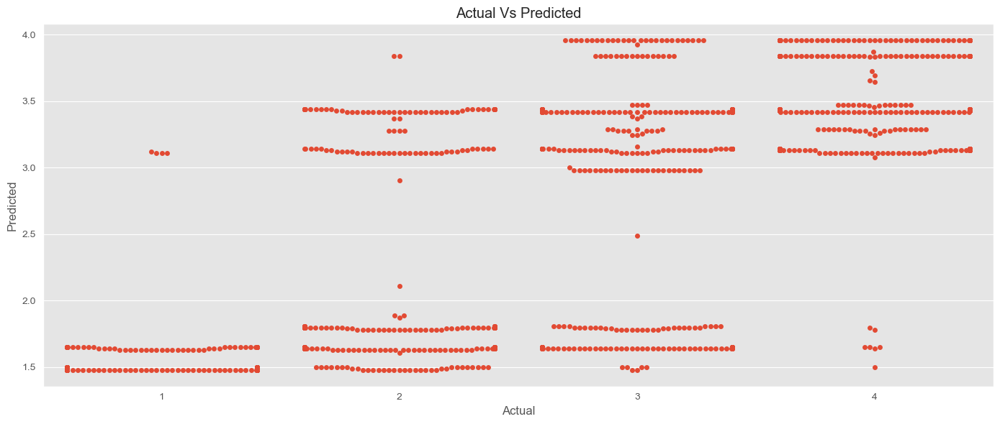

In [210]:
plt.figure(figsize=(14,6))
sns.swarmplot(x=B_test, y=pred) 
plt.title('Actual Vs Predicted')
plt.xlabel('Actual', fontsize=12)
plt.ylabel('Predicted', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
import joblib
joblib.dump(Finalmodel1,'Price range.pkl')